In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h1 style='margin:10px 5px'>Introduction</h1>
</div>

<div>
<img src="images/m5.png" width="500"/>
</div>
<br>


The **Makridakis competitions** (or M-competitions), organised by forecasting expert Spyros Makridakis, aim to provide a better understanding and advancement of forecasting methodology by comparing the performance of different methods in solving a well-defined, real-world problem. The first M-competition was held in 1982. The fourth competition (M4) ran in 2018 and featured “100,000 time series and 61 forecasting methods” (source in link). 

According to forecasting researcher and practitioner Rob Hyndman the M-competitions “have had an enormous influence on the field of forecasting. They focused attention on what models produced good forecasts, rather than on the mathematical properties of those models”. This empirical approach is very similar to Kaggle’s trade-mark way of having the best machine learning algorithms engage in intense competition on diverse datasets.

**Goal** 

The challenge is to predict sales data provided by the retail giant ***Walmart*** 28 days into the future.

**Data** 

There are 14 hierarchical time series, obtained in 10 stores in 3 US states of California (CA), Texas (TX), & Wisconsin (WI). “Hierarchical” here means that data can be aggregated on different levels: item level, department level, product category level, state level and country level. Sales information reaches back from Jan 2011 to June 2016, and corresponding data on prices, promotions, and holidays is also given.

**Hierarchy**

The hierarchical structure looks as follows:

\begin{equation}
Total = CA + TX + WI \\
CA = CA_1 + CA_2 + CA_3 + CA_4 \\
TX = TX_1 + TX_2 + TX_3 \\
WI = WI_1 + WI_2 + WI_3 \\
\end{equation}

**Evaluation Metrics**

The point forecast will being evaluated using the **Mean Absolute Error (MAE)**, across each of 4 levels: Country, State, Store and Overall.

Note that all hierarchical levels are **equally weighted** to compute Overall MAE. The reason is because the total dollar sales of a product, measured across all three States, are equal to the sum of the dollar sales of this product when measured across all ten stores. Moreover, M5 does not focus on a particular decision-making problem, which means that there is no reason for weighting unequally the individual levels of the hierarchy.

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h1 style='margin:10px 5px'>Setup</h1>
</div>

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>Import Libraries</h2>
</div>

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
#Import general libraries
from IPython.display import Image
from datetime import datetime
from tqdm.autonotebook import tqdm
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

In [4]:
#Import Tensorflow libraries
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential, load_model, model_from_json
from tensorflow.keras.layers import Input, Dense, GRU, LSTM, Embedding, Dropout
from tensorflow.keras.optimizers import RMSprop, Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
import tensorflow as tf
import tensorboard as tb

In [5]:
#Import time series libraries
from neuralprophet import NeuralProphet
from datasetsforecast.hierarchical import HierarchicalData
from hierarchicalforecast.core import HierarchicalReconciliation
from hierarchicalforecast.methods import  BottomUp, TopDown, MiddleOut, MinTrace, ERM
from statsforecast.core import StatsForecast
from statsforecast.models import AutoARIMA, Naive
from hierarchicalforecast.evaluation import HierarchicalEvaluation

In [6]:
#Import GluonTS libraries
# !pip install mxnet
# !pip install gluonts
from gluonts.evaluation import Evaluator
from gluonts.dataset.common import load_datasets, ListDataset
from gluonts.dataset.field_names import FieldName
from gluonts.mx.model.deepar import DeepAREstimator
from gluonts.mx.distribution.neg_binomial import NegativeBinomialOutput
from gluonts.mx.trainer import Trainer
from gluonts.evaluation.backtest import make_evaluation_predictions
from mxnet import gluon
import mxnet as mx

INFO:gluonts.mx.context:Using CPU


In [7]:
#Import PyTorch based libraries
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.tuner import Tuner
from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import MAE, SMAPE, RMSE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
import torch
import torch.nn as nn
import torch.optim as optim
import lightning.pytorch as pl

In [8]:
#Set configurations
%matplotlib inline
plt.style.use('default') 
pd.set_option("display.max_columns",500)
pd.set_option("display.max_rows",500)
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>Data</h2>
</div>

In [9]:
df = pd.read_csv('data/sales_train_evaluation.csv')
calendar_df = pd.read_csv("data/calendar.csv")
sell_prices_df = pd.read_csv("data/sell_prices.csv")

In [10]:
#Select item for which forecasting needs to be done
item = "FOODS_3_819"

In [11]:
#Subset for a particular item ID
df = df.loc[df.item_id==item]

#Making long format
df_T = df.melt(id_vars=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'])
df_T.drop(columns=['id'], inplace=True)

#Getting date
sales_df = df_T.merge(calendar_df, left_on='variable', right_on='d', how='left')
sales_df.rename(columns={'value': 'sales_qty'}, inplace=True)

In [12]:
df_final = sales_df.loc[:, ['date', 'store_id', 'sales_qty']]
df_final['state_id'] = df_final['store_id'].str[:2]

In [13]:
df_final

,date,store_id,sales_qty,state_id
0,2011-01-29,CA_1,3,CA
1,2011-01-29,CA_2,7,CA
2,2011-01-29,CA_3,8,CA
3,2011-01-29,CA_4,4,CA
4,2011-01-29,TX_1,2,TX
...,...,...,...,...
19405,2016-05-22,TX_2,0,TX
19406,2016-05-22,TX_3,1,TX
19407,2016-05-22,WI_1,7,WI
19408,2016-05-22,WI_2,0,WI


In [14]:
#create the long format matrix: individual stores
df_ind = df_final.groupby(['date', 'store_id'])[['sales_qty']].sum()
df_ind.reset_index(inplace=True)
df_ind = df_ind.T.reset_index(drop=True).T
df_ind.columns = ['ds', 'unique_id', 'sales']

# create the long format matrix: state level
df_sta = df_final.groupby(['date', 'state_id'])[['sales_qty']].sum()
df_sta.reset_index(inplace=True)
df_sta.columns = ['ds', 'unique_id', 'sales']

# create the long format matrix: total level
df_tot = df_final.groupby(['date'])[['sales_qty']].sum()
df_tot.reset_index(inplace=True)
df_tot['unique_id'] = 'Total'
df_tot.columns = ['ds', 'sales', 'unique_id' ]

# combine all three
dfx = pd.concat([df_ind, df_sta, df_tot], axis = 0)
print(df_ind.shape, df_sta.shape, df_tot.shape, dfx.shape)

# format
xset = set(dfx.unique_id)
dfx.columns = ['ds','unique_id', 'y']
dfx['ds'] = pd.to_datetime(dfx['ds'])
dfx.head(10)

(19410, 3) (5823, 3) (1941, 3) (27174, 3)


,ds,unique_id,y
0,2011-01-29,CA_1,3
1,2011-01-29,CA_2,7
2,2011-01-29,CA_3,8
3,2011-01-29,CA_4,4
4,2011-01-29,TX_1,2
5,2011-01-29,TX_2,0
6,2011-01-29,TX_3,9
7,2011-01-29,WI_1,8
8,2011-01-29,WI_2,1
9,2011-01-29,WI_3,14


In [15]:
#Correct the data type of target variable
dfx["y"] = dfx["y"].astype(float)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>Feature Engineering</h2>
</div>

In [16]:
#Add time index for TemporalFusionTransformers
dfx["time_idx"] = (dfx.loc[:,"ds"] - dfx.loc[:,"ds"].min()).dt.days
dfx.head()

,ds,unique_id,y,time_idx
0,2011-01-29,CA_1,3.0,0
1,2011-01-29,CA_2,7.0,0
2,2011-01-29,CA_3,8.0,0
3,2011-01-29,CA_4,4.0,0
4,2011-01-29,TX_1,2.0,0


In [17]:
dfx.rename(columns={"unique_id":"group_id"},inplace=True)

In [18]:
#Add additional features
dfx["month"] = dfx.ds.dt.month.astype(str).astype("category")  # categories have to be strings
dfx["log_sales"] = np.log(dfx.y + 1e-8)
dfx["avg_sales_by_group"] = dfx.groupby(["time_idx", "group_id"], observed=True).y.transform("mean")

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Getting Calendar Events</h3>
</div>

In [19]:
#Get Special Days as a list
special_days = set(calendar_df["event_name_1"].unique())
special_days.update(calendar_df["event_name_2"].unique())
special_days = [val for val in special_days if not pd.isna(val)]

In [20]:
ohe_1 = OneHotEncoder()
ohe_2 = OneHotEncoder()

In [21]:
ohe_arr_1 = ohe_1.fit_transform(calendar_df[["event_name_1"]]).toarray()
ohe_arr_2 = ohe_2.fit_transform(calendar_df[["event_name_2"]]).toarray()

In [22]:
ohe_df_1 = pd.DataFrame(columns=[col.split("event_name_1_")[1] for col in ohe_1.get_feature_names_out()], data=ohe_arr_1).drop("nan",axis=1)
ohe_df_2 = pd.DataFrame(columns=[col.split("event_name_2_")[1] for col in ohe_2.get_feature_names_out()], data=ohe_arr_2).drop("nan",axis=1)

In [23]:
#All columns of ohe_df_2 are present in ohe_df_1
for col in ohe_df_2.columns:
    ohe_df_1[col] = ohe_df_1[col] + ohe_df_2[col]

In [24]:
ohe_df_1.insert(0,"ds",calendar_df["date"])

In [25]:
ohe_df_1["ds"] = pd.to_datetime(ohe_df_1["ds"])
ohe_df_1.head()

,ds,Chanukah End,Christmas,Cinco De Mayo,ColumbusDay,Easter,Eid al-Fitr,EidAlAdha,Father's day,Halloween,IndependenceDay,LaborDay,LentStart,LentWeek2,MartinLutherKingDay,MemorialDay,Mother's day,NBAFinalsEnd,NBAFinalsStart,NewYear,OrthodoxChristmas,OrthodoxEaster,Pesach End,PresidentsDay,Purim End,Ramadan starts,StPatricksDay,SuperBowl,Thanksgiving,ValentinesDay,VeteransDay
0,2011-01-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2011-01-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2011-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2011-02-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2011-02-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
### Data leakage for log_sales and avg_sales_by_group

In [27]:
final_df = pd.merge(dfx,ohe_df_1,on="ds")
final_df.head()

,ds,group_id,y,time_idx,month,log_sales,avg_sales_by_group,Chanukah End,Christmas,Cinco De Mayo,ColumbusDay,Easter,Eid al-Fitr,EidAlAdha,Father's day,Halloween,IndependenceDay,LaborDay,LentStart,LentWeek2,MartinLutherKingDay,MemorialDay,Mother's day,NBAFinalsEnd,NBAFinalsStart,NewYear,OrthodoxChristmas,OrthodoxEaster,Pesach End,PresidentsDay,Purim End,Ramadan starts,StPatricksDay,SuperBowl,Thanksgiving,ValentinesDay,VeteransDay
0,2011-01-29,CA_1,3.0,0,1,1.098612,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2011-01-29,CA_2,7.0,0,1,1.945910,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2011-01-29,CA_3,8.0,0,1,2.079442,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2011-01-29,CA_4,4.0,0,1,1.386294,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2011-01-29,TX_1,2.0,0,1,0.693147,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
final_df[special_days] = final_df[special_days].apply(lambda x: x.map({0: "-", 1: x.name})).astype("category")

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Adding Selling Price Feature</h3>
</div>

In [29]:
sub_sell_price_df = sell_prices_df.loc[sell_prices_df.item_id == item].groupby("wm_yr_wk")["sell_price"].mean().reset_index()
sub_sell_price_df.head()

,wm_yr_wk,sell_price
0,11101,1.980000
1,11102,1.980000
2,11103,1.955556
3,11104,1.955556
4,11105,1.955556


In [30]:
sub_calendar_df = calendar_df[["date","wm_yr_wk"]].drop_duplicates()
sub_calendar_df.head()

,date,wm_yr_wk
0,2011-01-29,11101
1,2011-01-30,11101
2,2011-01-31,11101
3,2011-02-01,11101
4,2011-02-02,11101


In [31]:
merged_price_df = pd.merge(sub_calendar_df,sub_sell_price_df,on="wm_yr_wk")
merged_price_df.rename(columns={"date":"ds"},inplace=True)
merged_price_df["ds"] = pd.to_datetime(merged_price_df["ds"])

In [32]:
final_df = pd.merge(final_df,merged_price_df[["ds","sell_price"]],on="ds")
final_df.head()

,ds,group_id,y,time_idx,month,log_sales,avg_sales_by_group,Chanukah End,Christmas,Cinco De Mayo,ColumbusDay,Easter,Eid al-Fitr,EidAlAdha,Father's day,Halloween,IndependenceDay,LaborDay,LentStart,LentWeek2,MartinLutherKingDay,MemorialDay,Mother's day,NBAFinalsEnd,NBAFinalsStart,NewYear,OrthodoxChristmas,OrthodoxEaster,Pesach End,PresidentsDay,Purim End,Ramadan starts,StPatricksDay,SuperBowl,Thanksgiving,ValentinesDay,VeteransDay,sell_price
0,2011-01-29,CA_1,3.0,0,1,1.098612,3.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98
1,2011-01-29,CA_2,7.0,0,1,1.945910,7.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98
2,2011-01-29,CA_3,8.0,0,1,2.079442,8.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98
3,2011-01-29,CA_4,4.0,0,1,1.386294,4.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98
4,2011-01-29,TX_1,2.0,0,1,0.693147,2.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98


In [33]:
final_df.tail()

,ds,group_id,y,time_idx,month,log_sales,avg_sales_by_group,Chanukah End,Christmas,Cinco De Mayo,ColumbusDay,Easter,Eid al-Fitr,EidAlAdha,Father's day,Halloween,IndependenceDay,LaborDay,LentStart,LentWeek2,MartinLutherKingDay,MemorialDay,Mother's day,NBAFinalsEnd,NBAFinalsStart,NewYear,OrthodoxChristmas,OrthodoxEaster,Pesach End,PresidentsDay,Purim End,Ramadan starts,StPatricksDay,SuperBowl,Thanksgiving,ValentinesDay,VeteransDay,sell_price
27169,2016-05-22,WI_3,1.0,1940,5,1.000000e-08,1.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98
27170,2016-05-22,CA,8.0,1940,5,2.079442e+00,8.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98
27171,2016-05-22,TX,1.0,1940,5,1.000000e-08,1.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98
27172,2016-05-22,WI,8.0,1940,5,2.079442e+00,8.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98
27173,2016-05-22,Total,17.0,1940,5,2.833213e+00,17.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,1.98


In [34]:
data = final_df.copy(deep=True)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>Evaluation Matrix</h2>
</div>

In [35]:
error_matrix = pd.DataFrame([["Non-Hierarchical","LSTM-Stateless"],
                             ["Non-Hierarchical","LSTM-Stateful"],
                            ["Non-Hierarchical","TemporalFusionTransformer"],
                            ["Non-Hierarchical","NeuralProphet"],
                            ["Non-Hierarchical","DeepAR"],
                            ["Non-Hierarchical","BHM-Nixtla-Pooled"],
                            ["Hierarchical","BHM-Nixtla-BottomUp"],
                            ["Hierarchical","BHM-Nixtla-TopDown"],
                            ["Hierarchical","BHM-Nixtla-MiddleOut"],
                            ["Hierarchical","BHM-Nixtla-MinTrace"]],
                        columns=["Model Type","Algorithm"])
error_matrix[["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = 0
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,0,0,0,0
1,Non-Hierarchical,LSTM-Stateful,0,0,0,0
2,Non-Hierarchical,TemporalFusionTransformer,0,0,0,0
3,Non-Hierarchical,NeuralProphet,0,0,0,0
4,Non-Hierarchical,DeepAR,0,0,0,0
5,Non-Hierarchical,BHM-Nixtla-Pooled,0,0,0,0
6,Hierarchical,BHM-Nixtla-BottomUp,0,0,0,0
7,Hierarchical,BHM-Nixtla-TopDown,0,0,0,0
8,Hierarchical,BHM-Nixtla-MiddleOut,0,0,0,0
9,Hierarchical,BHM-Nixtla-MinTrace,0,0,0,0


<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>Modelling Configuration</h2>
</div>

In [36]:
#Validation period is last 2 weeks
prediction_length = 28
training_cutoff = data["time_idx"].max() - prediction_length

In [37]:
#Training and Validation Data
training_df = data[lambda x: x.time_idx <= training_cutoff]
validation_df = data[lambda x: x.time_idx > training_cutoff]

In [38]:
#Independent Features
feature_cols = training_df.columns[7:]
feature_cols

Index(['Chanukah End', 'Christmas', 'Cinco De Mayo', 'ColumbusDay', 'Easter',
       'Eid al-Fitr', 'EidAlAdha', 'Father's day', 'Halloween',
       'IndependenceDay', 'LaborDay', 'LentStart', 'LentWeek2',
       'MartinLutherKingDay', 'MemorialDay', 'Mother's day', 'NBAFinalsEnd',
       'NBAFinalsStart', 'NewYear', 'OrthodoxChristmas', 'OrthodoxEaster',
       'Pesach End', 'PresidentsDay', 'Purim End', 'Ramadan starts',
       'StPatricksDay', 'SuperBowl', 'Thanksgiving', 'ValentinesDay',
       'VeteransDay', 'sell_price'],
      dtype='object')

In [39]:
group_ids_ls = training_df.group_id.unique()
group_ids_ls

array(['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1',
       'WI_2', 'WI_3', 'CA', 'TX', 'WI', 'Total'], dtype=object)

In [40]:
#For plots
title_mapping_dict = {
    'CA_1':"California Store 1",
    'CA_2':"California Store 2", 
    'CA_3':"California Store 3", 
    'CA_4':"California Store 4", 
    'TX_1':"Texas Store 1", 
    'TX_2':"Texas Store 2", 
    'TX_3':"Texas Store 3", 
    'WI_1':"Wisconsin Store 1",
    'WI_2':"Wisconsin Store 2",
    'WI_3':"Wisconsin Store 3", 
    'CA':"California", 
    'TX':"Texas", 
    'WI':"Wisconsin", 
    'Total':"Total USA"
}

The `hierarchicalforecast` implementation requires tags: a dictionary describing the composition of each level:

In [41]:
tags = {}
tags['Country'] = np.array(['Total'], dtype=object)
tags['Country/State'] = np.array(['CA', 'TX', 'WI'], dtype=object)
tags['Country/State/Store'] = np.array(['CA_1', 'CA_2', 'CA_3', 'CA_4',  
                                        'TX_1', 'TX_2', 'TX_3',
                                        'WI_1', 'WI_2', 'WI_3'], dtype=object)
tags

{'Country': array(['Total'], dtype=object),
 'Country/State': array(['CA', 'TX', 'WI'], dtype=object),
 'Country/State/Store': array(['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1',
        'WI_2', 'WI_3'], dtype=object)}

In [42]:
#Initialize predictions dataframe
predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])

In [43]:
#Helper function to get actuals vs. predicted
def get_actsvspred(algorithm, predictions_df, overallmae):
    fig,axs = plt.subplots(7,2,figsize=(30,20))
    for i, group_id in enumerate(group_ids_ls):
        sub_df = predictions_df.loc[(predictions_df.algorithm == algorithm) & (predictions_df.hierarchy == group_id)]
        mae = np.round(mean_absolute_error(sub_df.loc[sub_df.index[-prediction_length:],"actuals"],sub_df.loc[sub_df.index[-prediction_length:],"predicted"]),1)

        axs[i//2,i%2].plot(sub_df.loc[sub_df.index[-3*prediction_length:],"date"], sub_df.loc[sub_df.index[-3*prediction_length:],"actuals"], '-', label='Actual Sales')
        axs[i//2,i%2].plot(sub_df.loc[sub_df.index[-prediction_length:],"date"], sub_df.loc[sub_df.index[-prediction_length:],"predicted"], 'r--', label=algorithm + ' Predicted Sales' )
        axs[i//2,i%2].axvspan(sub_df.loc[sub_df.index[-prediction_length],"date"], sub_df.loc[sub_df.index[-1],"date"],  facecolor='g', alpha=0.1)
        axs[i//2,i%2].legend(loc="upper left")
        axs[i//2,i%2].set_title(title_mapping_dict[group_id] + " (MAE=" + str(mae) + ")")

    for ax in axs.flat:
        ax.set(ylabel = "Retail Sales")
    fig.suptitle(algorithm + " - Actuals vs. Predicted (MAE=" + str(overallmae) + ")", fontsize=18)
    fig.tight_layout()

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h1 style='margin:10px 5px'>Non-Hierarchical Forecasting with Deep Neural Networks</h1>
</div>

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>1. Long Short-Term Memory Networks (LSTM) with TensorFlow</h2>
</div>

<div>
<img src="images/lstm-architecture.png" width="800"/>
</div>
<br>
<center>Figure: LSTM Cell Architecture</center>

Long Short-Term Memory Networks (LSTM) work very much like a basic RNN cell, except the training converges faster and the network is able to learn long-term dependencies in the data. The network maintains two state vectors - the cell state (referred to as the long-term state), and the hidden state (referred to as short-term state) - which explain the name of the networks.

**Gate Controllers**

There are three gate controllers which decide when to store or forget information.

- *Input gate*: Recognizes an important input and store in the long-term state.
- *Forget gate*: Preserves memory in the long-term state for as long as it's needed.
- *Output gate*: Extracts output from the long-term state whenever needed.

**Variations of LSTM Networks**

There are three main variations of LSTMs.

- *Peephole connections*: Additional input from current state of cell state is fed into sigmoid activation functions
- *Connected forget and input gates*: When forget gate output = 0, then input gate output = 1, and vice-versa
- *Gated Recurrent Units*: Remove the cell state and have only hidden state. The gate controllers also modify a little


<div>
<img src="images/lstm-variants.png" width="1000"/>
</div>
<br>
<center>Figure: LSTM with Peephole Connections; LSTM with forget and input gates connected; Gated Recurrent Units (from left to right)</center>

**Stateless vs. Stateful LSTM**

The primary difference lies in how each handles the sequence data and their internal states during training and prediction.

- *Stateless LSTM*:
In a stateless LSTM, each input sequence is treated independently during training and prediction. The LSTM's internal state is reset after processing each sequence in a batch. It means that the model does not retain any information about the previous sequence when processing the next one. This makes the training process easier and faster as each sequence is treated in isolation.


- *Stateful LSTM*:
In a stateful LSTM, the internal state of the LSTM is preserved between sequences within a batch during training and prediction. This means that the model retains the hidden states from one sequence and uses them as the initial state for the next sequence in the same batch. Stateful LSTMs are useful when the order of the sequences is critical and when you want the model to have memory of past sequences.

***When to use each type:***

- *Stateless LSTM*: Stateless LSTMs are generally used when the sequences are independent of each other, and the order does not play a significant role in the problem. It is commonly used when dealing with short sequences or when the model is applied to multiple unrelated sequences.


- *Stateful LSTM*: Stateful LSTMs are suitable for tasks where the order and continuity of the sequences matter, such as in language modeling, music generation, or time series forecasting. By preserving the internal state, the model can better capture long-term dependencies within the sequences.

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Configuration</h3>
</div>

In [44]:
path_checkpoint = 'checkpoint.tf' #define path of checkpoint
n_steps = 1000 #steps for TimeSeriesGenerator object

#Hyperparameters
batch_size_stateless = 256
batch_size_stateful = 1
n_neurons_layer_1 = 64
n_neurons_layer_2 = 32
n_neurons_layer_3 = 32
n_epochs_stateless = 50
n_epochs_stateful = 5
dropout = 0.2
lr = 1e-3
loss = "mean_squared_error"

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Helper Functions</h3>
</div>

In [45]:
#Define callback function
def create_callbacks():
    #Callback for writing checkpoint while training
    path_checkpoint = 'checkpoint.tf'
    callback_checkpoint = ModelCheckpoint(filepath=path_checkpoint,
                                          monitor='val_loss',
                                          verbose=1,
                                          save_weights_only=True,
                                          save_best_only=True)

    #Creating TensorBoard callback to capture performance profiles and call it while model training
    logs = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
    callback_tensorboard = TensorBoard(log_dir=logs,
                                       histogram_freq=1,
                                       profile_batch = '500,520')

    #Callback for reducing learning rate if validation loss doesn't improve from last epoch (patience set as 0). The lr
    #is multiplied by factor = 0.1.
    callback_reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                           factor=0.1,
                                           min_lr=1e-4,
                                           patience=0,
                                           verbose=1)

    callbacks = [callback_checkpoint,
                 callback_tensorboard,
                 callback_reduce_lr]
    return(callbacks)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Example Data Preprocessing and Training</h3>
</div>

**We now convert the Pandas dataframes to NumPy arrays that can be input to the neural network.**

In [46]:
#For explanation sake, we're choosing one particular group ID
group_id = "CA_1"

In [47]:
#Modifying values of special days
proc_training_df = training_df.copy(deep=True)
proc_validation_df = pd.concat([training_df,validation_df],axis=0).copy(deep=True)

for special_day in special_days:
    proc_training_df[special_day] = proc_training_df[special_day].replace({"-":0,special_day:1}).astype(int)
    proc_validation_df[special_day] = proc_validation_df[special_day].replace({"-":0,special_day:1}).astype(int)

In [48]:
sub_proc_training_df = proc_training_df.loc[proc_training_df.group_id == group_id,:]
sub_proc_validation_df = proc_validation_df.loc[proc_validation_df.group_id == group_id,:]

In [49]:
####Converting Pandas dataframes to NumPy arrays
#Input signals
train_x_data = sub_proc_training_df[sub_proc_training_df.columns[7:]].values
val_x_data = sub_proc_validation_df[sub_proc_validation_df.columns[7:]].tail(prediction_length).values

#Target-signals
train_y_data = sub_proc_training_df["y"].values.reshape(-1,1)
val_y_data = sub_proc_validation_df["y"].tail(prediction_length).values.reshape(-1,1)

**Next, the data is normalized since neural networks work best on values roughly between -1 and 1.**

In [50]:
#### Normalizing the Data

#Since neural networks work best with data scaled between -1 and 1, we first scale the data
x_scaler = MinMaxScaler()
x_train_scaled = x_scaler.fit_transform(train_x_data)
x_val_scaled = x_scaler.transform(val_x_data)

y_scaler = MinMaxScaler()
y_train_scaled = y_scaler.fit_transform(train_y_data)
y_val_scaled = y_scaler.transform(val_y_data)

print(x_train_scaled.shape, x_val_scaled.shape)
print(y_train_scaled.shape, y_val_scaled.shape)

(1913, 31) (28, 31)
(1913, 1) (28, 1)


**Reshaping for TimeseriesGenerator Object**

<div>
<img src="images/timeseriesgenerator-tf.png" width="1200"/>
</div>
<br>
<center>Figure: Training and Validation Strategy - LSTM</center>

**Once the 4 batches are completed, 1 epoch is over. Once all epochs (50 for stateless LSTM in this example) are completed with their training, then evaluation/validation is performed.**

In [51]:
n_features = x_train_scaled.shape[1]

In [52]:
x_train_arr = x_train_scaled[:-prediction_length]
y_train_arr = np.array([y_train_scaled.T[0][i:i+prediction_length] for i in range(len(y_train_scaled)-prediction_length)])

x_val_arr = x_train_scaled[-n_steps:]
y_val_arr = y_val_scaled.reshape(1,-1)

print(x_train_arr.shape, y_train_arr.shape)
print(x_val_arr.shape, y_val_arr.shape)

(1885, 31) (1885, 28)
(1000, 31) (1, 28)


In [53]:
x_val_arr = x_val_arr.reshape((1, n_steps, n_features))
print(x_val_arr.shape)

(1, 1000, 31)


**Creating TimeseriesGenerator object**

In [54]:
train_data_gen = TimeseriesGenerator(x_train_arr, y_train_arr,
                               length=n_steps,
                               batch_size=batch_size_stateless)

In [55]:
#Length of train data generator
len(train_data_gen) == np.ceil((x_train_arr.shape[0]-n_steps)/batch_size_stateless)

True

In [56]:
#Creating callbacks
callbacks = create_callbacks()

2023-08-01 08:16:17.469976: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 08:16:17.469990: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 08:16:17.470483: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


In [57]:
#Stacked LSTM Model
model = Sequential()
model.add(LSTM(n_neurons_layer_1, return_sequences=True, input_shape=(n_steps, n_features), dropout=dropout))
model.add(LSTM(n_neurons_layer_2, return_sequences=True, dropout=dropout))
model.add(LSTM(n_neurons_layer_3, dropout=dropout))
model.add(Dense(prediction_length))

# optimizer = RMSprop(lr=lr)
optimizer = Adam(lr=lr)
model.compile(loss=loss, optimizer=optimizer)

print(model.summary())

2023-08-01 08:16:17.482293: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1000, 64)          24576     
                                                                 
 lstm_1 (LSTM)               (None, 1000, 32)          12416     
                                                                 
 lstm_2 (LSTM)               (None, 32)                8320      
                                                                 
 dense (Dense)               (None, 28)                924       
                                                                 
Total params: 46,236
Trainable params: 46,236
Non-trainable params: 0
_________________________________________________________________
None


In [58]:
%%time
model.fit(x=train_data_gen, epochs=n_epochs_stateless, steps_per_epoch=len(train_data_gen), validation_data=(x_val_arr, y_val_arr), callbacks=callbacks)

Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0086
Epoch 00001: val_loss improved from inf to 0.00485, saving model to checkpoint.tf
4/4 [==============================] - 12s 3s/step - loss: 0.0086 - val_loss: 0.0048 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0067
Epoch 00002: val_loss improved from 0.00485 to 0.00428, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0067 - val_loss: 0.0043 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0060
Epoch 00003: val_loss improved from 0.00428 to 0.00406, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0060 - val_loss: 0.0041 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0057
Epoch 00004: val_loss improved from 0.00406 to 0.00361, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0057 - val_loss:

Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00034: val_loss did not improve from 0.00321
4/4 [==============================] - 8s 2s/step - loss: 0.0050 - val_loss: 0.0032 - lr: 1.0000e-04
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00035: val_loss improved from 0.00321 to 0.00321, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0050 - val_loss: 0.0032 - lr: 1.0000e-04
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00036: val_loss did not improve from 0.00321
4/4 [==============================] - 8s 2s/step - loss: 0.0050 - val_loss: 0.0032 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00037: val_loss did not improve from 0.00321
4/4 [==============================] - 8s 2s/step - loss: 0.0050 - val_loss: 0.0032 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - 

In [59]:
#Reload last saved checkpoint that has best performance on validation set, since early stopping was used
try:
    model.load_weights(path_checkpoint)
except Exception as error:
    print("Error trying to load checkpoint.")
    print(error)

In [60]:
y_val_pred = model.predict(x=x_val_arr)
#Inverse Scaling
y_val_pred = y_scaler.inverse_transform(y_val_pred)

In [61]:
#Get MAE
error  = np.round(mean_absolute_error(val_y_data.reshape(1,-1),y_val_pred),3)
error

1.533

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Stacked LSTM Model with Dropout (Stateless)</h3>
</div>

In [62]:
error_ls = []
algorithm = 'LSTM-Stateless'

In [63]:
for group_id in group_ids_ls:
    #Modifying values of special days
    proc_training_df = training_df.copy(deep=True)
    proc_validation_df = pd.concat([training_df,validation_df],axis=0).copy(deep=True)

    for special_day in special_days:
        proc_training_df[special_day] = proc_training_df[special_day].replace({"-":0,special_day:1}).astype(int)
        proc_validation_df[special_day] = proc_validation_df[special_day].replace({"-":0,special_day:1}).astype(int)

    sub_proc_training_df = proc_training_df.loc[proc_training_df.group_id == group_id,:]
    sub_proc_validation_df = proc_validation_df.loc[proc_validation_df.group_id == group_id,:]

    ####Converting Pandas dataframes to NumPy arrays
    #Input signals
    train_x_data = sub_proc_training_df[feature_cols].values
    val_x_data = sub_proc_validation_df[feature_cols].tail(prediction_length).values

    #Target-signals
    train_y_data = sub_proc_training_df["y"].values.reshape(-1,1)
    val_y_data = sub_proc_validation_df["y"].tail(prediction_length).values.reshape(-1,1)

    #Next, the data is normalized since neural networks work best on values roughly between -1 and 1.
    #### Normalizing the Data
    #Since neural networks work best with data scaled between -1 and 1, we first scale the data
    x_scaler = MinMaxScaler()
    x_train_scaled = x_scaler.fit_transform(train_x_data)
    x_val_scaled = x_scaler.transform(val_x_data)

    y_scaler = MinMaxScaler()
    y_train_scaled = y_scaler.fit_transform(train_y_data)
    y_val_scaled = y_scaler.transform(val_y_data)

    print(x_train_scaled.shape, x_val_scaled.shape)
    print(y_train_scaled.shape, y_val_scaled.shape)

    #Reshaping for TimeseriesGenerator Object
    n_steps = n_steps
    n_features = x_train_scaled.shape[1]

    x_train_arr = x_train_scaled[:-prediction_length]
    y_train_arr = np.array([y_train_scaled.T[0][i:i+prediction_length] for i in range(len(y_train_scaled)-prediction_length)])

    x_val_arr = x_train_scaled[-n_steps:]
    y_val_arr = y_val_scaled.reshape(1,-1)

    print(x_train_arr.shape, y_train_arr.shape)
    print(x_val_arr.shape, y_val_arr.shape)

    x_val_arr = x_val_arr.reshape((1, n_steps, n_features))
    print(x_val_arr.shape)

    #Training
    #Creating TimeseriesGenerator object
    train_data_gen = TimeseriesGenerator(x_train_arr, y_train_arr,
                                   length=n_steps,
                                   batch_size=batch_size_stateless)

    #Length of train data generator
    len(train_data_gen) == np.ceil((x_train_arr.shape[0]-n_steps)/batch_size_stateless)

    #Creating callbacks
    callbacks = create_callbacks()

    #Stacked LSTM Model
    model = Sequential()
    model.add(LSTM(n_neurons_layer_1, return_sequences=True, input_shape=(n_steps, n_features), dropout=dropout))
    model.add(LSTM(n_neurons_layer_2, return_sequences=True, dropout=dropout))
    model.add(LSTM(n_neurons_layer_3, dropout=dropout))
    model.add(Dense(prediction_length))

    # optimizer = RMSprop(lr=lr)
    optimizer = Adam(lr=lr)
    model.compile(loss=loss, optimizer=optimizer)
    model.fit(x=train_data_gen, epochs=n_epochs_stateless, steps_per_epoch=len(train_data_gen), validation_data=(x_val_arr, y_val_arr), callbacks=callbacks)

    #Reload last saved checkpoint that has best performance on validation set, since early stopping was used
    path_checkpoint = 'checkpoint.tf'
    try:
        model.load_weights(path_checkpoint)
    except Exception as error:
        print("Error trying to load checkpoint.")
        print(error)

    y_val_pred = model.predict(x=x_val_arr)
    #Inverse Scaling
    y_val_pred = y_scaler.inverse_transform(y_val_pred)
    
    #Save predictions 
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = y_val_pred[0]
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

    #Get MAE
    error  = np.round(mean_absolute_error(val_y_data.reshape(1,-1),y_val_pred),3)
    error_ls.append(error)

(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 08:23:01.240717: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 08:23:01.240730: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 08:23:01.240750: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0081
Epoch 00001: val_loss improved from inf to 0.00637, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0081 - val_loss: 0.0064 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0070
Epoch 00002: val_loss improved from 0.00637 to 0.00584, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0070 - val_loss: 0.0058 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0062
Epoch 00003: val_loss improved from 0.00584 to 0.00458, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0062 - val_loss: 0.0046 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0058
Epoch 00004: val_loss improved from 0.00458 to 0.00362, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0058 - val_loss:

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00036: val_loss did not improve from 0.00327
4/4 [==============================] - 8s 2s/step - loss: 0.0050 - val_loss: 0.0033 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00037: val_loss did not improve from 0.00327
4/4 [==============================] - 8s 2s/step - loss: 0.0050 - val_loss: 0.0033 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00038: val_loss did not improve from 0.00327
4/4 [==============================] - 8s 2s/step - loss: 0.0050 - val_loss: 0.0033 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00039: val_loss did not improve from 0.00327
4/4 [==============================] - 8s 2s/step - loss: 0.0050 - val_loss: 0.0033 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00040: val_loss 

2023-08-01 08:29:31.363737: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 08:29:31.363749: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 08:29:31.363767: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0129
Epoch 00001: val_loss improved from inf to 0.00977, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0129 - val_loss: 0.0098 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0111
Epoch 00002: val_loss improved from 0.00977 to 0.00925, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0111 - val_loss: 0.0092 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0097
Epoch 00003: val_loss improved from 0.00925 to 0.00883, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0097 - val_loss: 0.0088 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00004: val_loss improved from 0.00883 to 0.00803, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0092 - val_loss:

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0085
Epoch 00036: val_loss did not improve from 0.00595
4/4 [==============================] - 8s 2s/step - loss: 0.0085 - val_loss: 0.0063 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0086
Epoch 00037: val_loss did not improve from 0.00595
4/4 [==============================] - 7s 2s/step - loss: 0.0086 - val_loss: 0.0063 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0085
Epoch 00038: val_loss did not improve from 0.00595
4/4 [==============================] - 8s 2s/step - loss: 0.0085 - val_loss: 0.0063 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0085
Epoch 00039: val_loss did not improve from 0.00595
4/4 [==============================] - 8s 2s/step - loss: 0.0085 - val_loss: 0.0063 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0085
Epoch 00040: val_loss 

2023-08-01 08:35:59.162797: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 08:35:59.162809: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 08:35:59.162828: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0127
Epoch 00001: val_loss improved from inf to 0.00473, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0127 - val_loss: 0.0047 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0100
Epoch 00002: val_loss improved from 0.00473 to 0.00348, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0100 - val_loss: 0.0035 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0087
Epoch 00003: val_loss improved from 0.00348 to 0.00314, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0087 - val_loss: 0.0031 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0079
Epoch 00004: val_loss did not improve from 0.00314

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4/4 [========================

2023-08-01 08:42:21.951577: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 08:42:21.951590: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 08:42:21.951609: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0125
Epoch 00001: val_loss improved from inf to 0.01372, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0125 - val_loss: 0.0137 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0107
Epoch 00002: val_loss improved from 0.01372 to 0.01249, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0107 - val_loss: 0.0125 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0101
Epoch 00003: val_loss improved from 0.01249 to 0.01159, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0101 - val_loss: 0.0116 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0096
Epoch 00004: val_loss improved from 0.01159 to 0.01056, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0096 - val_loss:

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00036: val_loss did not improve from 0.00956
4/4 [==============================] - 8s 2s/step - loss: 0.0092 - val_loss: 0.0099 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00037: val_loss did not improve from 0.00956
4/4 [==============================] - 8s 2s/step - loss: 0.0092 - val_loss: 0.0098 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00038: val_loss did not improve from 0.00956
4/4 [==============================] - 8s 2s/step - loss: 0.0092 - val_loss: 0.0098 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00039: val_loss did not improve from 0.00956
4/4 [==============================] - 8s 2s/step - loss: 0.0092 - val_loss: 0.0098 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00040: val_loss 

(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 08:48:45.043234: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 08:48:45.043248: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 08:48:45.043270: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0036
Epoch 00001: val_loss improved from inf to 0.00375, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0036 - val_loss: 0.0038 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0036
Epoch 00002: val_loss improved from 0.00375 to 0.00339, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0036 - val_loss: 0.0034 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0034
Epoch 00003: val_loss improved from 0.00339 to 0.00323, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0034 - val_loss: 0.0032 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0034
Epoch 00004: val_loss improved from 0.00323 to 0.00313, saving model to checkpoint.tf

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0001000000047497

Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.0032
Epoch 00035: val_loss did not improve from 0.00307
4/4 [==============================] - 8s 2s/step - loss: 0.0032 - val_loss: 0.0031 - lr: 1.0000e-04
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0032
Epoch 00036: val_loss did not improve from 0.00307
4/4 [==============================] - 8s 2s/step - loss: 0.0032 - val_loss: 0.0031 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0032
Epoch 00037: val_loss did not improve from 0.00307
4/4 [==============================] - 8s 2s/step - loss: 0.0032 - val_loss: 0.0031 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0032
Epoch 00038: val_loss did not improve from 0.00307
4/4 [==============================] - 8s 2s/step - loss: 0.0032 - val_loss: 0.0031 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0032
Epoch 00039: val_loss 

(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 08:55:12.486498: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 08:55:12.486513: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 08:55:12.486535: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0041
Epoch 00001: val_loss improved from inf to 0.00137, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0041 - val_loss: 0.0014 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0034
Epoch 00002: val_loss did not improve from 0.00137

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4/4 [==============================] - 8s 2s/step - loss: 0.0034 - val_loss: 0.0015 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0032
Epoch 00003: val_loss did not improve from 0.00137

Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0001.
4/4 [==============================] - 7s 2s/step - loss: 0.0032 - val_loss: 0.0015 - lr: 1.0000e-04
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0032
Epoch 00004: val_loss did not improve from 0.00137
4/4 [========================

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00036: val_loss did not improve from 0.00120
4/4 [==============================] - 8s 2s/step - loss: 0.0029 - val_loss: 0.0012 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00037: val_loss did not improve from 0.00120
4/4 [==============================] - 8s 2s/step - loss: 0.0029 - val_loss: 0.0013 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00038: val_loss did not improve from 0.00120
4/4 [==============================] - 8s 2s/step - loss: 0.0029 - val_loss: 0.0013 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00039: val_loss did not improve from 0.00120
4/4 [==============================] - 8s 2s/step - loss: 0.0029 - val_loss: 0.0013 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00040: val_loss 

2023-08-01 09:01:41.968855: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:01:41.968869: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:01:41.968890: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0085
Epoch 00001: val_loss improved from inf to 0.00586, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0085 - val_loss: 0.0059 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0074
Epoch 00002: val_loss improved from 0.00586 to 0.00578, saving model to checkpoint.tf

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4/4 [==============================] - 7s 2s/step - loss: 0.0074 - val_loss: 0.0058 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0071
Epoch 00003: val_loss improved from 0.00578 to 0.00565, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0071 - val_loss: 0.0056 - lr: 1.0000e-04
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0071
Epoch 00004: val_loss improved from 0.00565 to 0.00546, saving model to chec

Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.0068
Epoch 00033: val_loss did not improve from 0.00442
4/4 [==============================] - 8s 2s/step - loss: 0.0068 - val_loss: 0.0045 - lr: 1.0000e-04
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.0068
Epoch 00034: val_loss did not improve from 0.00442
4/4 [==============================] - 8s 2s/step - loss: 0.0068 - val_loss: 0.0045 - lr: 1.0000e-04
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.0068
Epoch 00035: val_loss did not improve from 0.00442
4/4 [==============================] - 8s 2s/step - loss: 0.0068 - val_loss: 0.0044 - lr: 1.0000e-04
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0067
Epoch 00036: val_loss improved from 0.00442 to 0.00442, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0067 - val_loss: 0.0044 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - 

2023-08-01 09:08:08.916865: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:08:08.916879: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:08:08.916901: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0264
Epoch 00001: val_loss improved from inf to 0.01235, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0264 - val_loss: 0.0124 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0206
Epoch 00002: val_loss improved from 0.01235 to 0.00909, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0206 - val_loss: 0.0091 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0162
Epoch 00003: val_loss improved from 0.00909 to 0.00766, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0162 - val_loss: 0.0077 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0135
Epoch 00004: val_loss did not improve from 0.00766

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4/4 [========================

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0111
Epoch 00036: val_loss did not improve from 0.00687
4/4 [==============================] - 8s 2s/step - loss: 0.0111 - val_loss: 0.0072 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0111
Epoch 00037: val_loss did not improve from 0.00687
4/4 [==============================] - 8s 2s/step - loss: 0.0111 - val_loss: 0.0072 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0111
Epoch 00038: val_loss did not improve from 0.00687
4/4 [==============================] - 8s 2s/step - loss: 0.0111 - val_loss: 0.0072 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0110
Epoch 00039: val_loss did not improve from 0.00687
4/4 [==============================] - 8s 2s/step - loss: 0.0110 - val_loss: 0.0072 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0111
Epoch 00040: val_loss 

2023-08-01 09:14:42.696724: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:14:42.696738: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:14:42.696760: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0263
Epoch 00001: val_loss improved from inf to 0.01298, saving model to checkpoint.tf
4/4 [==============================] - 12s 2s/step - loss: 0.0263 - val_loss: 0.0130 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0216
Epoch 00002: val_loss improved from 0.01298 to 0.01120, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0216 - val_loss: 0.0112 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0194
Epoch 00003: val_loss improved from 0.01120 to 0.00986, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0194 - val_loss: 0.0099 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0184
Epoch 00004: val_loss improved from 0.00986 to 0.00866, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0184 - val_loss:

Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.0170
Epoch 00033: val_loss improved from 0.00743 to 0.00741, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0170 - val_loss: 0.0074 - lr: 1.0000e-04
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.0170
Epoch 00034: val_loss did not improve from 0.00741
4/4 [==============================] - 8s 2s/step - loss: 0.0170 - val_loss: 0.0074 - lr: 1.0000e-04
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.0170
Epoch 00035: val_loss did not improve from 0.00741
4/4 [==============================] - 8s 2s/step - loss: 0.0170 - val_loss: 0.0074 - lr: 1.0000e-04
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0170
Epoch 00036: val_loss improved from 0.00741 to 0.00739, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0170 - val_loss: 0.0074 - lr: 1.0000e-04
Epoch 37/50
4/4 [=========

2023-08-01 09:21:23.719886: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:21:23.719899: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:21:23.719921: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0081
Epoch 00001: val_loss improved from inf to 0.00607, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0081 - val_loss: 0.0061 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0062
Epoch 00002: val_loss improved from 0.00607 to 0.00557, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0062 - val_loss: 0.0056 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0056
Epoch 00003: val_loss improved from 0.00557 to 0.00510, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0056 - val_loss: 0.0051 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0052
Epoch 00004: val_loss improved from 0.00510 to 0.00464, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0052 - val_loss:

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0049
Epoch 00036: val_loss did not improve from 0.00361
4/4 [==============================] - 8s 2s/step - loss: 0.0049 - val_loss: 0.0038 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0049
Epoch 00037: val_loss did not improve from 0.00361
4/4 [==============================] - 8s 2s/step - loss: 0.0049 - val_loss: 0.0038 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0049
Epoch 00038: val_loss did not improve from 0.00361
4/4 [==============================] - 8s 2s/step - loss: 0.0049 - val_loss: 0.0038 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0049
Epoch 00039: val_loss did not improve from 0.00361
4/4 [==============================] - 8s 2s/step - loss: 0.0049 - val_loss: 0.0038 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0049
Epoch 00040: val_loss 

2023-08-01 09:28:01.654101: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:28:01.654115: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:28:01.654138: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0216
Epoch 00001: val_loss improved from inf to 0.01374, saving model to checkpoint.tf
4/4 [==============================] - 12s 2s/step - loss: 0.0216 - val_loss: 0.0137 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0154
Epoch 00002: val_loss improved from 0.01374 to 0.00931, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0154 - val_loss: 0.0093 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0115
Epoch 00003: val_loss improved from 0.00931 to 0.00807, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0115 - val_loss: 0.0081 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0093
Epoch 00004: val_loss improved from 0.00807 to 0.00569, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0093 - val_loss:

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0072
Epoch 00036: val_loss did not improve from 0.00327
4/4 [==============================] - 8s 2s/step - loss: 0.0072 - val_loss: 0.0037 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0072
Epoch 00037: val_loss did not improve from 0.00327
4/4 [==============================] - 8s 2s/step - loss: 0.0072 - val_loss: 0.0037 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0071
Epoch 00038: val_loss did not improve from 0.00327
4/4 [==============================] - 8s 2s/step - loss: 0.0071 - val_loss: 0.0037 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0072
Epoch 00039: val_loss did not improve from 0.00327
4/4 [==============================] - 8s 2s/step - loss: 0.0072 - val_loss: 0.0037 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0072
Epoch 00040: val_loss 

2023-08-01 09:34:40.166815: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:34:40.166828: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:34:40.166852: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0087
Epoch 00001: val_loss improved from inf to 0.00410, saving model to checkpoint.tf
4/4 [==============================] - 12s 2s/step - loss: 0.0087 - val_loss: 0.0041 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0066
Epoch 00002: val_loss improved from 0.00410 to 0.00345, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0066 - val_loss: 0.0035 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0056
Epoch 00003: val_loss improved from 0.00345 to 0.00315, saving model to checkpoint.tf
4/4 [==============================] - 10s 2s/step - loss: 0.0056 - val_loss: 0.0032 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0050
Epoch 00004: val_loss improved from 0.00315 to 0.00258, saving model to checkpoint.tf
4/4 [==============================] - 9s 2s/step - loss: 0.0050 - val_loss

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0042
Epoch 00036: val_loss did not improve from 0.00229
4/4 [==============================] - 8s 2s/step - loss: 0.0042 - val_loss: 0.0024 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0042
Epoch 00037: val_loss did not improve from 0.00229
4/4 [==============================] - 8s 2s/step - loss: 0.0042 - val_loss: 0.0024 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0042
Epoch 00038: val_loss did not improve from 0.00229
4/4 [==============================] - 8s 2s/step - loss: 0.0042 - val_loss: 0.0024 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0042
Epoch 00039: val_loss did not improve from 0.00229
4/4 [==============================] - 8s 2s/step - loss: 0.0042 - val_loss: 0.0023 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0042
Epoch 00040: val_loss 

2023-08-01 09:41:43.599596: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:41:43.599611: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:41:43.599632: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0466
Epoch 00001: val_loss improved from inf to 0.02389, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0466 - val_loss: 0.0239 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0347
Epoch 00002: val_loss improved from 0.02389 to 0.01859, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0347 - val_loss: 0.0186 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0270
Epoch 00003: val_loss improved from 0.01859 to 0.01197, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0270 - val_loss: 0.0120 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0211
Epoch 00004: val_loss improved from 0.01197 to 0.00850, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0211 - val_loss:

Epoch 33/50
4/4 [==============================] - ETA: 0s - loss: 0.0147
Epoch 00033: val_loss did not improve from 0.00565
4/4 [==============================] - 9s 2s/step - loss: 0.0147 - val_loss: 0.0057 - lr: 1.0000e-04
Epoch 34/50
4/4 [==============================] - ETA: 0s - loss: 0.0148
Epoch 00034: val_loss improved from 0.00565 to 0.00558, saving model to checkpoint.tf
4/4 [==============================] - 9s 2s/step - loss: 0.0148 - val_loss: 0.0056 - lr: 1.0000e-04
Epoch 35/50
4/4 [==============================] - ETA: 0s - loss: 0.0147
Epoch 00035: val_loss improved from 0.00558 to 0.00554, saving model to checkpoint.tf
4/4 [==============================] - 9s 2s/step - loss: 0.0147 - val_loss: 0.0055 - lr: 1.0000e-04
Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0148
Epoch 00036: val_loss did not improve from 0.00554
4/4 [==============================] - 9s 3s/step - loss: 0.0148 - val_loss: 0.0056 - lr: 1.0000e-04
Epoch 37/50
4/4 [=========

2023-08-01 09:49:01.391845: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:49:01.391859: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:49:01.391882: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


Epoch 1/50
4/4 [==============================] - ETA: 0s - loss: 0.0363
Epoch 00001: val_loss improved from inf to 0.02172, saving model to checkpoint.tf
4/4 [==============================] - 11s 2s/step - loss: 0.0363 - val_loss: 0.0217 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - ETA: 0s - loss: 0.0265
Epoch 00002: val_loss improved from 0.02172 to 0.01300, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0265 - val_loss: 0.0130 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - ETA: 0s - loss: 0.0161
Epoch 00003: val_loss improved from 0.01300 to 0.00829, saving model to checkpoint.tf
4/4 [==============================] - 7s 2s/step - loss: 0.0161 - val_loss: 0.0083 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - ETA: 0s - loss: 0.0118
Epoch 00004: val_loss improved from 0.00829 to 0.00580, saving model to checkpoint.tf
4/4 [==============================] - 8s 2s/step - loss: 0.0118 - val_loss:

Epoch 36/50
4/4 [==============================] - ETA: 0s - loss: 0.0068
Epoch 00036: val_loss did not improve from 0.00275
4/4 [==============================] - 8s 2s/step - loss: 0.0068 - val_loss: 0.0031 - lr: 1.0000e-04
Epoch 37/50
4/4 [==============================] - ETA: 0s - loss: 0.0068
Epoch 00037: val_loss did not improve from 0.00275
4/4 [==============================] - 8s 2s/step - loss: 0.0068 - val_loss: 0.0032 - lr: 1.0000e-04
Epoch 38/50
4/4 [==============================] - ETA: 0s - loss: 0.0068
Epoch 00038: val_loss did not improve from 0.00275
4/4 [==============================] - 8s 2s/step - loss: 0.0068 - val_loss: 0.0031 - lr: 1.0000e-04
Epoch 39/50
4/4 [==============================] - ETA: 0s - loss: 0.0068
Epoch 00039: val_loss did not improve from 0.00275
4/4 [==============================] - 8s 2s/step - loss: 0.0068 - val_loss: 0.0031 - lr: 1.0000e-04
Epoch 40/50
4/4 [==============================] - ETA: 0s - loss: 0.0067
Epoch 00040: val_loss 

In [64]:
#Get MAE
error_country  = np.round(error_ls[-1],3)
error_state  = np.round(np.mean(error_ls[-4:-1]),3)
error_store  = np.round(np.mean(error_ls[:-4]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == algorithm,["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,0.000,0.000,0.000,0.000
2,Non-Hierarchical,TemporalFusionTransformer,0.000,0.000,0.000,0.000
3,Non-Hierarchical,NeuralProphet,0.000,0.000,0.000,0.000
4,Non-Hierarchical,DeepAR,0.000,0.000,0.000,0.000
5,Non-Hierarchical,BHM-Nixtla-Pooled,0.000,0.000,0.000,0.000
6,Hierarchical,BHM-Nixtla-BottomUp,0.000,0.000,0.000,0.000
7,Hierarchical,BHM-Nixtla-TopDown,0.000,0.000,0.000,0.000
8,Hierarchical,BHM-Nixtla-MiddleOut,0.000,0.000,0.000,0.000
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


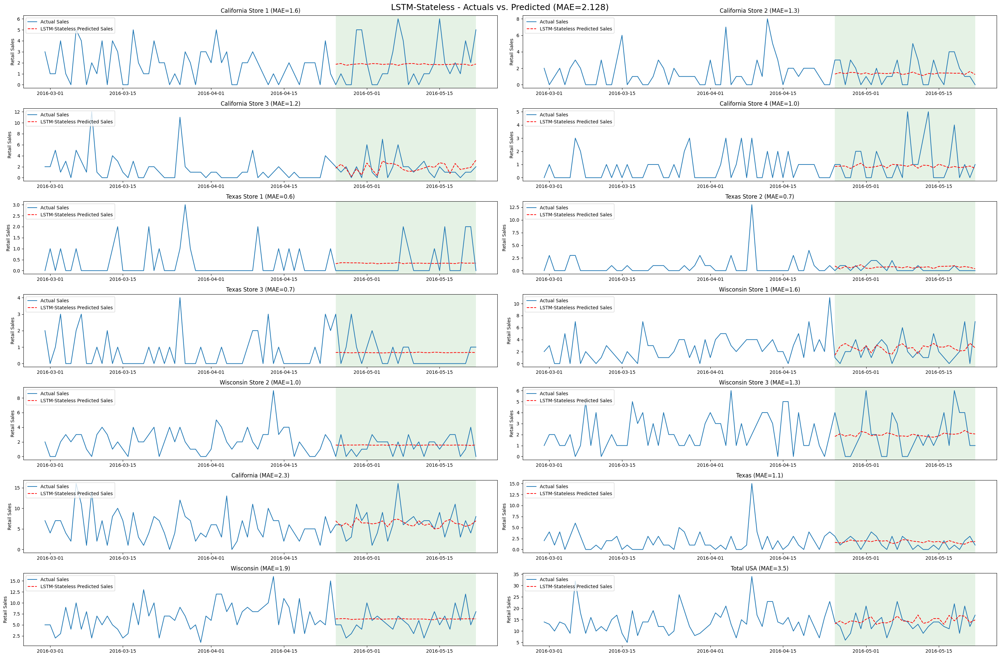

In [65]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Stacked LSTM Model with Memory Between Batches and Dropout (Stateful)</h3>
</div>

In [66]:
error_ls = []
algorithm = 'LSTM-Stateful'

In [67]:
for group_id in group_ids_ls:
    #Modifying values of special days
    proc_training_df = training_df.copy(deep=True)
    proc_validation_df = pd.concat([training_df,validation_df],axis=0).copy(deep=True)

    for special_day in special_days:
        proc_training_df[special_day] = proc_training_df[special_day].replace({"-":0,special_day:1}).astype(int)
        proc_validation_df[special_day] = proc_validation_df[special_day].replace({"-":0,special_day:1}).astype(int)

    sub_proc_training_df = proc_training_df.loc[proc_training_df.group_id == group_id,:]
    sub_proc_validation_df = proc_validation_df.loc[proc_validation_df.group_id == group_id,:]

    ####Converting Pandas dataframes to NumPy arrays
    #Input signals
    train_x_data = sub_proc_training_df[feature_cols].values
    val_x_data = sub_proc_validation_df[feature_cols].tail(prediction_length).values

    #Target-signals
    train_y_data = sub_proc_training_df["y"].values.reshape(-1,1)
    val_y_data = sub_proc_validation_df["y"].tail(prediction_length).values.reshape(-1,1)

    #Next, the data is normalized since neural networks work best on values roughly between -1 and 1.

    #### Normalizing the Data

    #Since neural networks work best with data scaled between -1 and 1, we first scale the data
    x_scaler = MinMaxScaler()
    x_train_scaled = x_scaler.fit_transform(train_x_data)
    x_val_scaled = x_scaler.transform(val_x_data)

    y_scaler = MinMaxScaler()
    y_train_scaled = y_scaler.fit_transform(train_y_data)
    y_val_scaled = y_scaler.transform(val_y_data)

    print(x_train_scaled.shape, x_val_scaled.shape)
    print(y_train_scaled.shape, y_val_scaled.shape)

    #Reshaping for TimeseriesGenerator Object
    n_features = x_train_scaled.shape[1]

    x_train_arr = x_train_scaled[:-prediction_length]
    y_train_arr = np.array([y_train_scaled.T[0][i:i+prediction_length] for i in range(len(y_train_scaled)-prediction_length)])

    x_val_arr = x_train_scaled[-n_steps:]
    y_val_arr = y_val_scaled.reshape(1,-1)

    print(x_train_arr.shape, y_train_arr.shape)
    print(x_val_arr.shape, y_val_arr.shape)

    x_val_arr = x_val_arr.reshape((1, n_steps, n_features))
    print(x_val_arr.shape)

    #Training

    #Creating TimeseriesGenerator object
    train_data_gen = TimeseriesGenerator(x_train_arr, y_train_arr,
                                   length=n_steps,
                                   batch_size=batch_size_stateful)

    #Length of train data generator
    len(train_data_gen) == np.ceil((x_train_arr.shape[0]-n_steps)/batch_size_stateful)

    #Creating callbacks
    callbacks = create_callbacks()

    #Stacked LSTM Model
    model = Sequential()
    model.add(LSTM(n_neurons_layer_1, return_sequences=True, stateful=True, batch_input_shape=(batch_size_stateful, n_steps, n_features),dropout=dropout))
    model.add(LSTM(n_neurons_layer_2, stateful=True, batch_input_shape=(batch_size_stateful, n_steps, n_features), return_sequences=True, dropout=dropout))
    model.add(LSTM(n_neurons_layer_3, stateful=True, batch_input_shape=(batch_size_stateful, n_steps, n_features), dropout=dropout))
    model.add(Dense(prediction_length))

    # optimizer = RMSprop(lr=lr)
    optimizer = Adam(lr=lr)
    model.compile(loss=loss, optimizer=optimizer)
    for i in range(n_epochs_stateful):
        model.fit(x=train_data_gen, epochs=1, steps_per_epoch=len(train_data_gen), batch_size = batch_size_stateful, shuffle=False, validation_data=(x_val_arr, y_val_arr), callbacks=callbacks)
        model.reset_states()

    #Reload last saved checkpoint that has best performance on validation set, since early stopping was used
    try:
        model.load_weights(path_checkpoint)
    except Exception as error:
        print("Error trying to load checkpoint.")
        print(error)

    y_val_pred = model.predict(x=x_val_arr)
    #Inverse Scaling
    y_val_pred = y_scaler.inverse_transform(y_val_pred)

    #Save predictions 
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = y_val_pred[0]
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)
    
    #Get MAE
    error  = mean_absolute_error(val_y_data.reshape(1,-1),y_val_pred)
    error_ls.append(error)

(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 09:55:37.210012: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:55:37.210025: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 09:55:37.210098: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:01 - loss: 0.0053

2023-08-01 09:58:17.747923: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 09:58:17.747938: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0053

2023-08-01 09:58:26.398607: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 09:58:30.905326: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 09:58:35.171690: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_09_58_30

2023-08-01 09:58:37.152810: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_09_58_30/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 09:58:39.843217: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_09_58_30

2023-08-01 09:58:39.843720: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_09_58_30/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0047
Epoch 00001: val_loss improved from inf to 0.00325, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0051

2023-08-01 10:03:13.383049: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:03:13.383062: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0051

2023-08-01 10:03:21.254498: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:03:24.834891: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:03:28.222562: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_10_03_24

2023-08-01 10:03:30.267943: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_10_03_24/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:03:32.512825: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_10_03_24

2023-08-01 10:03:32.513346: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_10_03_24/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0046
Epoch 00001: val_loss did not improve from 0.00325
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0050

2023-08-01 10:08:04.679272: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:08:04.679325: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0050

2023-08-01 10:08:12.641154: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:08:16.450325: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:08:20.011891: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_10_08_16

2023-08-01 10:08:21.955388: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_10_08_16/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:08:24.287223: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_10_08_16

2023-08-01 10:08:24.287526: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_10_08_16/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0045
Epoch 00001: val_loss did not improve from 0.00325
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0050

2023-08-01 10:12:56.398142: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:12:56.398156: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0051

2023-08-01 10:13:04.388084: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:13:08.208752: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:13:11.669329: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_10_13_08

2023-08-01 10:13:13.622199: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_10_13_08/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:13:16.081006: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_10_13_08

2023-08-01 10:13:16.081891: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_10_13_08/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0046
Epoch 00001: val_loss did not improve from 0.00325
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0051

2023-08-01 10:17:48.629263: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:17:48.629277: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0051

2023-08-01 10:17:56.633714: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:18:00.384998: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:18:03.997657: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_10_18_00

2023-08-01 10:18:06.038409: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_10_18_00/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:18:08.412650: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-095537/plugins/profile/2023_08_01_10_18_00

2023-08-01 10:18:08.413149: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-095537/plugins/profile/2023_08_01_10_18_00/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0046
Epoch 00001: val_loss did not improve from 0.00325
885/885 [==============================] - 291s 329ms/step - loss: 0.0046 - val_loss: 0.0033 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 10:20:04.142486: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:20:04.142498: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 10:20:04.142518: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 1:59 - loss: 0.0087

2023-08-01 10:22:41.733656: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:22:41.733669: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:54 - loss: 0.0085

2023-08-01 10:22:50.046206: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:22:54.213140: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:22:58.114322: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_22_54

2023-08-01 10:23:00.120174: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_22_54/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:23:02.818047: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_22_54

2023-08-01 10:23:02.818914: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_22_54/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0083
Epoch 00001: val_loss improved from inf to 0.00644, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 1:59 - loss: 0.0083

2023-08-01 10:27:32.444372: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:27:32.444401: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:54 - loss: 0.0081

2023-08-01 10:27:40.532403: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:27:44.319372: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:27:48.059029: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_27_44

2023-08-01 10:27:50.017422: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_27_44/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:27:52.404295: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_27_44

2023-08-01 10:27:52.405425: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_27_44/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0081
Epoch 00001: val_loss improved from 0.00644 to 0.00636, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 1:59 - loss: 0.0083

2023-08-01 10:32:20.663877: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:32:20.663890: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:53 - loss: 0.0081

2023-08-01 10:32:28.088511: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:32:31.048891: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:32:34.056108: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_32_31

2023-08-01 10:32:36.006758: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_32_31/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:32:37.932729: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_32_31

2023-08-01 10:32:37.933141: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_32_31/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0081
Epoch 00001: val_loss improved from 0.00636 to 0.00635, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0082

2023-08-01 10:37:08.966500: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:37:08.966530: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0080

2023-08-01 10:37:16.672403: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:37:20.596853: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:37:24.292627: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_37_20

2023-08-01 10:37:26.338628: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_37_20/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:37:28.711431: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_37_20

2023-08-01 10:37:28.711706: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_37_20/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0080
Epoch 00001: val_loss improved from 0.00635 to 0.00630, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0082

2023-08-01 10:42:00.864520: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:42:00.864533: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0080

2023-08-01 10:42:08.240302: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:42:11.220422: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:42:14.453184: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_42_11

2023-08-01 10:42:16.446207: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_42_11/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:42:18.376923: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-102004/plugins/profile/2023_08_01_10_42_11

2023-08-01 10:42:18.377326: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-102004/plugins/profile/2023_08_01_10_42_11/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0080
Epoch 00001: val_loss did not improve from 0.00630
885/885 [==============================] - 289s 327ms/step - loss: 0.0080 - val_loss: 0.0063 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 10:44:14.008998: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:44:14.009012: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 10:44:14.009034: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:01 - loss: 0.0074

2023-08-01 10:46:54.135926: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:46:54.135940: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0073

2023-08-01 10:47:02.270978: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:47:06.561194: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:47:10.492624: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_10_47_06

2023-08-01 10:47:12.453812: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_10_47_06/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:47:14.843685: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_10_47_06

2023-08-01 10:47:14.845185: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_10_47_06/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0064
Epoch 00001: val_loss improved from inf to 0.00433, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0069

2023-08-01 10:51:48.048461: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:51:48.048474: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0068

2023-08-01 10:51:55.739915: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:51:58.995763: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:52:02.191183: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_10_51_58

2023-08-01 10:52:04.185627: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_10_51_58/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:52:06.220910: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_10_51_58

2023-08-01 10:52:06.221594: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_10_51_58/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0062
Epoch 00001: val_loss improved from 0.00433 to 0.00402, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0068

2023-08-01 10:56:38.731257: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 10:56:38.731271: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0066

2023-08-01 10:56:46.454921: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 10:56:49.910958: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 10:56:53.348470: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_10_56_49

2023-08-01 10:56:55.291261: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_10_56_49/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 10:56:57.406719: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_10_56_49

2023-08-01 10:56:57.407216: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_10_56_49/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0061
Epoch 00001: val_loss did not improve from 0.00402
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0068

2023-08-01 11:01:29.736674: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:01:29.736688: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0066

2023-08-01 11:01:36.886774: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:01:38.884728: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:01:40.820106: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_11_01_38

2023-08-01 11:01:42.111029: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_11_01_38/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:01:43.420440: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_11_01_38

2023-08-01 11:01:43.420863: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_11_01_38/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0061
Epoch 00001: val_loss did not improve from 0.00402
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0067

2023-08-01 11:06:15.941360: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:06:15.941394: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0065

2023-08-01 11:06:24.063093: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:06:28.286838: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:06:32.167588: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_11_06_28

2023-08-01 11:06:34.200335: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_11_06_28/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:06:36.658123: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-104414/plugins/profile/2023_08_01_11_06_28

2023-08-01 11:06:36.658624: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-104414/plugins/profile/2023_08_01_11_06_28/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0060
Epoch 00001: val_loss improved from 0.00402 to 0.00383, saving model to checkpoint.tf
885/885 [==============================] - 293s 332ms/step - loss: 0.0060 - val_loss: 0.0038 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 11:08:32.665364: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:08:32.665375: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 11:08:32.665395: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:02 - loss: 0.0119

2023-08-01 11:11:14.262703: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:11:14.262716: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0121

2023-08-01 11:11:22.288120: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:11:26.042198: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:11:29.558817: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_11_26

2023-08-01 11:11:31.573192: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_11_26/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:11:33.823814: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_11_26

2023-08-01 11:11:33.824093: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_11_26/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0093
Epoch 00001: val_loss improved from inf to 0.01018, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0117

2023-08-01 11:16:08.503409: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:16:08.503423: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0119

2023-08-01 11:16:17.436569: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:16:21.495137: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:16:25.570059: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_16_21

2023-08-01 11:16:27.906189: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_16_21/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:16:30.341560: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_16_21

2023-08-01 11:16:30.342336: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_16_21/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00001: val_loss did not improve from 0.01018
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0117

2023-08-01 11:21:04.353993: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:21:04.354007: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0119

2023-08-01 11:21:11.725793: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:21:14.136447: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:21:16.398840: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_21_14

2023-08-01 11:21:18.028743: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_21_14/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:21:19.583534: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_21_14

2023-08-01 11:21:19.583820: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_21_14/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00001: val_loss improved from 0.01018 to 0.01000, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0116

2023-08-01 11:25:53.815080: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:25:53.815107: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0118

2023-08-01 11:26:02.018147: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:26:06.077094: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:26:09.698865: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_26_06

2023-08-01 11:26:11.662915: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_26_06/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:26:14.035107: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_26_06

2023-08-01 11:26:14.035859: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_26_06/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0092
Epoch 00001: val_loss did not improve from 0.01000
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0115

2023-08-01 11:30:48.184865: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:30:48.184894: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0117

2023-08-01 11:30:56.233247: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:30:59.936193: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:31:03.353820: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_30_59

2023-08-01 11:31:05.399346: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_30_59/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:31:07.650103: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-110832/plugins/profile/2023_08_01_11_30_59

2023-08-01 11:31:07.650634: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-110832/plugins/profile/2023_08_01_11_30_59/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0091
Epoch 00001: val_loss did not improve from 0.01000
885/885 [==============================] - 293s 331ms/step - loss: 0.0091 - val_loss: 0.0103 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 11:33:04.077588: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:33:04.077600: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 11:33:04.077620: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:02 - loss: 0.0032

2023-08-01 11:35:44.722735: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:35:44.722747: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0031

2023-08-01 11:35:52.539284: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:35:56.021827: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:35:59.414824: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_35_56

2023-08-01 11:36:01.457229: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_35_56/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:36:03.628071: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_35_56

2023-08-01 11:36:03.629013: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_35_56/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0030
Epoch 00001: val_loss improved from inf to 0.00307, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:03 - loss: 0.0031

2023-08-01 11:40:39.008920: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:40:39.008972: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0030

2023-08-01 11:40:47.292518: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:40:51.061139: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:40:54.476270: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_40_51

2023-08-01 11:40:56.464928: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_40_51/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:40:58.727862: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_40_51

2023-08-01 11:40:58.728143: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_40_51/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00001: val_loss did not improve from 0.00307
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0030

2023-08-01 11:45:32.624458: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:45:32.624473: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0029

2023-08-01 11:45:39.988691: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:45:43.338580: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:45:46.641445: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_45_43

2023-08-01 11:45:48.625284: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_45_43/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:45:50.812975: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_45_43

2023-08-01 11:45:50.813996: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_45_43/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00001: val_loss did not improve from 0.00307
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0030

2023-08-01 11:50:24.022989: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:50:24.023004: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0029

2023-08-01 11:50:31.139698: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:50:32.960070: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:50:34.728361: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_50_32

2023-08-01 11:50:36.025967: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_50_32/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 11:50:37.279581: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_50_32

2023-08-01 11:50:37.279960: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_50_32/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00001: val_loss did not improve from 0.00307
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0030

2023-08-01 11:55:10.450747: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:55:10.450762: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0029

2023-08-01 11:55:17.511047: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 11:55:19.295826: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 11:55:20.858890: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_55_19

2023-08-01 11:55:22.029469: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_55_19/Anants-MacBook-Pro.local.trace.json.gz


520/885 [================>.............] - ETA: 1:59 - loss: 0.0029

2023-08-01 11:55:23.243413: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_55_19

2023-08-01 11:55:23.243952: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-113304/plugins/profile/2023_08_01_11_55_19/Anants-MacBook-Pro.local.memory_profile.json.gz
2023-08-01 11:55:23.266990: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: logs/20230801-113304/plugins/profile/2023_08_01_11_55_19
Dumped tool data for xplane.pb to logs/20230801-113304/plugins/profile/2023_08_01_11_55_19/Anants-MacBook-Pro.local.xplane.pb
Dumped tool data for overview_page.pb to logs/20230801-113304/plugins/profile/2023_08_01_11_55_19/Anants-MacBook-Pro.local.overview_page.pb
Dumped tool data for input_pipeline.pb to logs/20230801-113304/plugins/profile/2023_08_01_11_55_19/Anants-MacBook-Pro.local.input_pipeline.pb
Dumped tool d

885/885 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00001: val_loss did not improve from 0.00307
885/885 [==============================] - 287s 324ms/step - loss: 0.0029 - val_loss: 0.0031 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 11:57:20.491816: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 11:57:20.491829: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 11:57:20.491852: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:02 - loss: 0.0030

2023-08-01 12:00:02.369244: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:00:02.369257: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0030

2023-08-01 12:00:09.642281: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:00:11.709939: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:00:13.678457: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_00_11

2023-08-01 12:00:15.078672: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_00_11/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:00:16.422392: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_00_11

2023-08-01 12:00:16.422896: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_00_11/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00001: val_loss improved from inf to 0.00125, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0029

2023-08-01 12:04:50.651981: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:04:50.651995: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0029

2023-08-01 12:04:57.647269: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:04:59.354998: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:05:00.991080: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_04_59

2023-08-01 12:05:02.183844: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_04_59/Anants-MacBook-Pro.local.trace.json.gz


520/885 [================>.............] - ETA: 1:59 - loss: 0.0029

2023-08-01 12:05:03.352940: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_04_59

2023-08-01 12:05:03.353346: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_04_59/Anants-MacBook-Pro.local.memory_profile.json.gz
2023-08-01 12:05:03.379490: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_04_59
Dumped tool data for xplane.pb to logs/20230801-115720/plugins/profile/2023_08_01_12_04_59/Anants-MacBook-Pro.local.xplane.pb
Dumped tool data for overview_page.pb to logs/20230801-115720/plugins/profile/2023_08_01_12_04_59/Anants-MacBook-Pro.local.overview_page.pb
Dumped tool data for input_pipeline.pb to logs/20230801-115720/plugins/profile/2023_08_01_12_04_59/Anants-MacBook-Pro.local.input_pipeline.pb
Dumped tool d

885/885 [==============================] - ETA: 0s - loss: 0.0029
Epoch 00001: val_loss did not improve from 0.00125
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0028

2023-08-01 12:09:36.763136: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:09:36.763149: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0028

2023-08-01 12:09:44.467725: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:09:47.823115: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:09:51.012172: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_09_47

2023-08-01 12:09:53.022354: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_09_47/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:09:55.099765: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_09_47

2023-08-01 12:09:55.100864: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_09_47/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0028
Epoch 00001: val_loss did not improve from 0.00125
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0028

2023-08-01 12:14:28.220628: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:14:28.220643: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0028

2023-08-01 12:14:36.026619: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:14:39.969002: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:14:43.514962: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_14_39

2023-08-01 12:14:45.521907: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_14_39/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:14:47.930439: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_14_39

2023-08-01 12:14:47.931334: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_14_39/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0028
Epoch 00001: val_loss did not improve from 0.00125
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0028

2023-08-01 12:19:21.576316: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:19:21.576329: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0028

2023-08-01 12:19:29.466587: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:19:33.155599: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:19:36.615272: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_19_33

2023-08-01 12:19:38.612002: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_19_33/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:19:40.918360: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-115720/plugins/profile/2023_08_01_12_19_33

2023-08-01 12:19:40.918918: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-115720/plugins/profile/2023_08_01_12_19_33/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0028
Epoch 00001: val_loss did not improve from 0.00125
885/885 [==============================] - 292s 330ms/step - loss: 0.0028 - val_loss: 0.0013 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 12:21:36.998352: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:21:36.998364: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 12:21:36.998383: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:01 - loss: 0.0080

2023-08-01 12:24:17.012311: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:24:17.012325: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0078

2023-08-01 12:24:24.801317: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:24:28.470330: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:24:31.925134: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_24_28

2023-08-01 12:24:33.902860: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_24_28/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:24:36.182061: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_24_28

2023-08-01 12:24:36.182600: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_24_28/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0066
Epoch 00001: val_loss improved from inf to 0.00465, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0081

2023-08-01 12:29:09.084204: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:29:09.084217: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0079

2023-08-01 12:29:17.534026: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:29:21.825550: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:29:25.724817: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_29_21

2023-08-01 12:29:27.689481: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_29_21/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:29:30.284928: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_29_21

2023-08-01 12:29:30.285456: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_29_21/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0065
Epoch 00001: val_loss improved from 0.00465 to 0.00432, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0081

2023-08-01 12:34:02.127165: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:34:02.127177: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0079

2023-08-01 12:34:09.813759: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:34:13.464125: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:34:16.916875: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_34_13

2023-08-01 12:34:18.937926: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_34_13/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:34:21.185229: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_34_13

2023-08-01 12:34:21.186948: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_34_13/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0065
Epoch 00001: val_loss did not improve from 0.00432
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0081

2023-08-01 12:38:53.031828: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:38:53.031862: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0079

2023-08-01 12:39:00.280137: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:39:03.228048: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:39:06.186047: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_39_03

2023-08-01 12:39:08.145138: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_39_03/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:39:10.030366: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_39_03

2023-08-01 12:39:10.030648: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_39_03/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0066
Epoch 00001: val_loss did not improve from 0.00432
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0081

2023-08-01 12:43:42.399223: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:43:42.399238: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0080

2023-08-01 12:43:52.458603: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:43:59.618681: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:44:05.529034: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_43_59

2023-08-01 12:44:07.501518: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_43_59/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:44:11.163606: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-122136/plugins/profile/2023_08_01_12_43_59

2023-08-01 12:44:11.164671: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-122136/plugins/profile/2023_08_01_12_43_59/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0066
Epoch 00001: val_loss did not improve from 0.00432
885/885 [==============================] - 301s 341ms/step - loss: 0.0066 - val_loss: 0.0043 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 12:46:07.301650: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:46:07.301662: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 12:46:07.301683: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:02 - loss: 0.0104

2023-08-01 12:48:48.801219: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:48:48.801231: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0107

2023-08-01 12:48:56.684816: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:49:00.528615: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:49:04.105808: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_12_49_00

2023-08-01 12:49:06.172667: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_12_49_00/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:49:08.387674: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_12_49_00

2023-08-01 12:49:08.387951: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_12_49_00/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0113
Epoch 00001: val_loss improved from inf to 0.00642, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0099

2023-08-01 12:53:43.094053: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:53:43.094083: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0101

2023-08-01 12:53:50.202586: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:53:51.911249: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:53:53.354362: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_12_53_51

2023-08-01 12:53:54.464658: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_12_53_51/Anants-MacBook-Pro.local.trace.json.gz


520/885 [================>.............] - ETA: 1:59 - loss: 0.0102

2023-08-01 12:53:55.566946: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_12_53_51

2023-08-01 12:53:55.567347: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_12_53_51/Anants-MacBook-Pro.local.memory_profile.json.gz
2023-08-01 12:53:55.589253: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_12_53_51
Dumped tool data for xplane.pb to logs/20230801-124607/plugins/profile/2023_08_01_12_53_51/Anants-MacBook-Pro.local.xplane.pb
Dumped tool data for overview_page.pb to logs/20230801-124607/plugins/profile/2023_08_01_12_53_51/Anants-MacBook-Pro.local.overview_page.pb
Dumped tool data for input_pipeline.pb to logs/20230801-124607/plugins/profile/2023_08_01_12_53_51/Anants-MacBook-Pro.local.input_pipeline.pb
Dumped tool d

885/885 [==============================] - ETA: 0s - loss: 0.0109
Epoch 00001: val_loss did not improve from 0.00642
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0098

2023-08-01 12:58:29.146394: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 12:58:29.146407: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0100

2023-08-01 12:58:36.726237: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 12:58:40.283276: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 12:58:43.826876: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_12_58_40

2023-08-01 12:58:45.823533: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_12_58_40/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 12:58:47.943530: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_12_58_40

2023-08-01 12:58:47.944396: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_12_58_40/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0108
Epoch 00001: val_loss did not improve from 0.00642
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0098

2023-08-01 13:03:21.361430: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:03:21.361446: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0100

2023-08-01 13:03:28.440313: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:03:30.385487: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:03:32.177080: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_13_03_30

2023-08-01 13:03:33.482877: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_13_03_30/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:03:34.693032: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_13_03_30

2023-08-01 13:03:34.693336: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_13_03_30/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0107
Epoch 00001: val_loss did not improve from 0.00642
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0097

2023-08-01 13:08:07.714673: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:08:07.714686: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0099

2023-08-01 13:08:15.072770: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:08:17.796742: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:08:20.602628: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_13_08_17

2023-08-01 13:08:22.488828: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_13_08_17/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:08:24.253005: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-124607/plugins/profile/2023_08_01_13_08_17

2023-08-01 13:08:24.253322: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-124607/plugins/profile/2023_08_01_13_08_17/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0106
Epoch 00001: val_loss did not improve from 0.00642
885/885 [==============================] - 289s 327ms/step - loss: 0.0106 - val_loss: 0.0068 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 13:10:20.377171: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:10:20.377185: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 13:10:20.377209: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:01 - loss: 0.0168

2023-08-01 13:13:00.453020: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:13:00.453034: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0166

2023-08-01 13:13:08.705302: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:13:12.922592: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:13:16.603174: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_13_12

2023-08-01 13:13:18.631668: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_13_12/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:13:21.114963: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_13_12

2023-08-01 13:13:21.115393: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_13_12/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0168
Epoch 00001: val_loss improved from inf to 0.01066, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0160

2023-08-01 13:17:54.283859: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:17:54.283873: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0158

2023-08-01 13:18:01.497238: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:18:03.581598: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:18:05.586808: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_18_03

2023-08-01 13:18:07.003479: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_18_03/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:18:08.363078: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_18_03

2023-08-01 13:18:08.364693: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_18_03/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0162
Epoch 00001: val_loss improved from 0.01066 to 0.01006, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0159

2023-08-01 13:22:40.538426: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:22:40.538440: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0157

2023-08-01 13:22:48.045068: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:22:51.355573: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:22:54.749957: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_22_51

2023-08-01 13:22:56.800708: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_22_51/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:22:58.913961: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_22_51

2023-08-01 13:22:58.914552: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_22_51/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0161
Epoch 00001: val_loss improved from 0.01006 to 0.00944, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0159

2023-08-01 13:27:31.651721: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:27:31.651750: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0157

2023-08-01 13:27:39.407945: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:27:43.105265: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:27:46.824568: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_27_43

2023-08-01 13:27:48.800062: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_27_43/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:27:51.147395: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_27_43

2023-08-01 13:27:51.148467: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_27_43/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0161
Epoch 00001: val_loss did not improve from 0.00944
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0159

2023-08-01 13:32:23.810892: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:32:23.810905: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0157

2023-08-01 13:32:31.371497: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:32:35.208426: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:32:38.773785: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_32_35

2023-08-01 13:32:40.786553: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_32_35/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:32:43.149053: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-131020/plugins/profile/2023_08_01_13_32_35

2023-08-01 13:32:43.149364: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-131020/plugins/profile/2023_08_01_13_32_35/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0160
Epoch 00001: val_loss improved from 0.00944 to 0.00869, saving model to checkpoint.tf
885/885 [==============================] - 292s 330ms/step - loss: 0.0160 - val_loss: 0.0087 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 13:34:39.135865: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:34:39.135877: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 13:34:39.135896: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:01 - loss: 0.0057

2023-08-01 13:37:19.240382: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:37:19.240397: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0056

2023-08-01 13:37:26.310343: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:37:28.001947: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:37:29.621334: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_37_28

2023-08-01 13:37:30.696475: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_37_28/Anants-MacBook-Pro.local.trace.json.gz


520/885 [================>.............] - ETA: 1:58 - loss: 0.0056

2023-08-01 13:37:31.815924: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_37_28

2023-08-01 13:37:31.816370: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_37_28/Anants-MacBook-Pro.local.memory_profile.json.gz
2023-08-01 13:37:31.842790: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_37_28
Dumped tool data for xplane.pb to logs/20230801-133439/plugins/profile/2023_08_01_13_37_28/Anants-MacBook-Pro.local.xplane.pb
Dumped tool data for overview_page.pb to logs/20230801-133439/plugins/profile/2023_08_01_13_37_28/Anants-MacBook-Pro.local.overview_page.pb
Dumped tool data for input_pipeline.pb to logs/20230801-133439/plugins/profile/2023_08_01_13_37_28/Anants-MacBook-Pro.local.input_pipeline.pb
Dumped tool d

885/885 [==============================] - ETA: 0s - loss: 0.0049
Epoch 00001: val_loss improved from inf to 0.00374, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0055

2023-08-01 13:42:05.112262: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:42:05.112276: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0054

2023-08-01 13:42:12.137574: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:42:14.123496: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:42:15.917062: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_42_14

2023-08-01 13:42:17.152519: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_42_14/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:42:18.363329: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_42_14

2023-08-01 13:42:18.363600: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_42_14/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0048
Epoch 00001: val_loss improved from 0.00374 to 0.00373, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0054

2023-08-01 13:46:50.707334: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:46:50.707347: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0054

2023-08-01 13:46:58.667623: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:47:02.488936: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:47:06.032359: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_47_02

2023-08-01 13:47:08.098446: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_47_02/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:47:10.312153: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_47_02

2023-08-01 13:47:10.312443: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_47_02/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0047
Epoch 00001: val_loss improved from 0.00373 to 0.00370, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0053

2023-08-01 13:51:42.480163: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:51:42.480177: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0053

2023-08-01 13:51:49.549008: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:51:51.326128: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:51:53.009751: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_51_51

2023-08-01 13:51:54.331587: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_51_51/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 13:51:55.556382: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_51_51

2023-08-01 13:51:55.557020: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_51_51/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0046
Epoch 00001: val_loss did not improve from 0.00370
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0053

2023-08-01 13:56:30.317373: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:56:30.317387: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0053

2023-08-01 13:56:37.359921: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 13:56:39.286125: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 13:56:40.900960: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_56_39

2023-08-01 13:56:42.093187: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_56_39/Anants-MacBook-Pro.local.trace.json.gz


520/885 [================>.............] - ETA: 2:00 - loss: 0.0053

2023-08-01 13:56:43.280529: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_56_39

2023-08-01 13:56:43.280895: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-133439/plugins/profile/2023_08_01_13_56_39/Anants-MacBook-Pro.local.memory_profile.json.gz
2023-08-01 13:56:43.291609: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: logs/20230801-133439/plugins/profile/2023_08_01_13_56_39
Dumped tool data for xplane.pb to logs/20230801-133439/plugins/profile/2023_08_01_13_56_39/Anants-MacBook-Pro.local.xplane.pb
Dumped tool data for overview_page.pb to logs/20230801-133439/plugins/profile/2023_08_01_13_56_39/Anants-MacBook-Pro.local.overview_page.pb
Dumped tool data for input_pipeline.pb to logs/20230801-133439/plugins/profile/2023_08_01_13_56_39/Anants-MacBook-Pro.local.input_pipeline.pb
Dumped tool d

885/885 [==============================] - ETA: 0s - loss: 0.0046
Epoch 00001: val_loss did not improve from 0.00370
885/885 [==============================] - 287s 325ms/step - loss: 0.0046 - val_loss: 0.0039 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 13:58:39.703382: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 13:58:39.703394: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 13:58:39.703414: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:01 - loss: 0.0081

2023-08-01 14:01:19.592477: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:01:19.592492: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0080

2023-08-01 14:01:26.735029: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:01:28.486997: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:01:30.085054: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_01_28

2023-08-01 14:01:31.245908: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_01_28/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:01:32.390037: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_01_28

2023-08-01 14:01:32.390574: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_01_28/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0068
Epoch 00001: val_loss improved from inf to 0.00431, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0073

2023-08-01 14:06:05.598114: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:06:05.598128: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0072

2023-08-01 14:06:12.720216: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:06:14.680840: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:06:16.543750: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_06_14

2023-08-01 14:06:17.916734: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_06_14/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:06:19.206022: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_06_14

2023-08-01 14:06:19.206307: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_06_14/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0064
Epoch 00001: val_loss improved from 0.00431 to 0.00430, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0072

2023-08-01 14:10:51.831370: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:10:51.831384: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:55 - loss: 0.0071

2023-08-01 14:10:59.001830: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:11:01.167777: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:11:03.183439: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_11_01

2023-08-01 14:11:04.717998: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_11_01/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:11:06.126970: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_11_01

2023-08-01 14:11:06.127282: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_11_01/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0063
Epoch 00001: val_loss improved from 0.00430 to 0.00425, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0071

2023-08-01 14:15:39.112014: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:15:39.112028: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0071

2023-08-01 14:15:46.800285: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:15:49.851674: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:15:52.952978: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_15_49

2023-08-01 14:15:54.975597: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_15_49/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:15:56.890930: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_15_49

2023-08-01 14:15:56.891204: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_15_49/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0062
Epoch 00001: val_loss improved from 0.00425 to 0.00414, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:01 - loss: 0.0070

2023-08-01 14:20:31.100026: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:20:31.100039: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0069

2023-08-01 14:20:38.890042: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:20:42.608601: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:20:46.165227: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_20_42

2023-08-01 14:20:48.149615: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_20_42/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:20:50.361096: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-135839/plugins/profile/2023_08_01_14_20_42

2023-08-01 14:20:50.361449: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-135839/plugins/profile/2023_08_01_14_20_42/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0061
Epoch 00001: val_loss improved from 0.00414 to 0.00400, saving model to checkpoint.tf
885/885 [==============================] - 292s 330ms/step - loss: 0.0061 - val_loss: 0.0040 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 14:22:46.552476: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:22:46.552488: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 14:22:46.552507: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:02 - loss: 0.0048

2023-08-01 14:25:27.115372: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:25:27.115386: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0047

2023-08-01 14:25:35.057562: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:25:38.449887: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:25:41.851700: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_25_38

2023-08-01 14:25:43.844775: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_25_38/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:25:45.959728: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_25_38

2023-08-01 14:25:45.960003: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_25_38/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0043
Epoch 00001: val_loss improved from inf to 0.00229, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0046

2023-08-01 14:30:20.053724: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:30:20.053739: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0045

2023-08-01 14:30:28.268986: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:30:32.645813: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:30:36.602523: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_30_32

2023-08-01 14:30:38.605696: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_30_32/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:30:41.137773: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_30_32

2023-08-01 14:30:41.138175: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_30_32/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0042
Epoch 00001: val_loss improved from 0.00229 to 0.00227, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0045

2023-08-01 14:35:14.835502: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:35:14.835538: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0045

2023-08-01 14:35:22.934022: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:35:26.781308: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:35:30.464596: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_35_26

2023-08-01 14:35:32.417605: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_35_26/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:35:34.736589: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_35_26

2023-08-01 14:35:34.737141: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_35_26/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0042
Epoch 00001: val_loss did not improve from 0.00227
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0045

2023-08-01 14:40:08.995721: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:40:08.995735: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0044

2023-08-01 14:40:16.116203: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:40:17.937247: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:40:19.814687: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_40_17

2023-08-01 14:40:21.044021: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_40_17/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:40:22.197346: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_40_17

2023-08-01 14:40:22.197609: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_40_17/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0041
Epoch 00001: val_loss improved from 0.00227 to 0.00222, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0044

2023-08-01 14:44:56.328982: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:44:56.328998: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0043

2023-08-01 14:45:03.323719: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:45:05.032078: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:45:06.594063: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_45_05

2023-08-01 14:45:07.688060: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_45_05/Anants-MacBook-Pro.local.trace.json.gz


520/885 [================>.............] - ETA: 1:59 - loss: 0.0043

2023-08-01 14:45:08.786137: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_45_05

2023-08-01 14:45:08.786715: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-142246/plugins/profile/2023_08_01_14_45_05/Anants-MacBook-Pro.local.memory_profile.json.gz
2023-08-01 14:45:08.806780: I tensorflow/core/profiler/rpc/client/capture_profile.cc:251] Creating directory: logs/20230801-142246/plugins/profile/2023_08_01_14_45_05
Dumped tool data for xplane.pb to logs/20230801-142246/plugins/profile/2023_08_01_14_45_05/Anants-MacBook-Pro.local.xplane.pb
Dumped tool data for overview_page.pb to logs/20230801-142246/plugins/profile/2023_08_01_14_45_05/Anants-MacBook-Pro.local.overview_page.pb
Dumped tool data for input_pipeline.pb to logs/20230801-142246/plugins/profile/2023_08_01_14_45_05/Anants-MacBook-Pro.local.input_pipeline.pb
Dumped tool d

885/885 [==============================] - ETA: 0s - loss: 0.0040
Epoch 00001: val_loss improved from 0.00222 to 0.00211, saving model to checkpoint.tf
885/885 [==============================] - 286s 323ms/step - loss: 0.0040 - val_loss: 0.0021 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 14:47:06.135173: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:47:06.135185: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 14:47:06.135205: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:02 - loss: 0.0161

2023-08-01 14:49:46.859909: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:49:46.859938: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0164

2023-08-01 14:49:54.238337: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:49:56.609402: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:49:58.937462: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_14_49_56

2023-08-01 14:50:00.449365: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_14_49_56/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:50:01.908772: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_14_49_56

2023-08-01 14:50:01.909018: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_14_49_56/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0154
Epoch 00001: val_loss improved from inf to 0.01019, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0143

2023-08-01 14:54:37.359931: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:54:37.359945: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0146

2023-08-01 14:54:44.671992: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:54:47.059925: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:54:49.481304: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_14_54_47

2023-08-01 14:54:51.073990: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_14_54_47/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:54:52.563069: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_14_54_47

2023-08-01 14:54:52.563346: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_14_54_47/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0144
Epoch 00001: val_loss improved from 0.01019 to 0.00636, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:04 - loss: 0.0144

2023-08-01 14:59:30.019316: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 14:59:30.019330: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:59 - loss: 0.0147

2023-08-01 14:59:38.051470: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 14:59:41.492025: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 14:59:45.202262: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_14_59_41

2023-08-01 14:59:47.684643: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_14_59_41/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 14:59:49.771344: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_14_59_41

2023-08-01 14:59:49.771706: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_14_59_41/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0144
Epoch 00001: val_loss improved from 0.00636 to 0.00593, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:04 - loss: 0.0143

2023-08-01 15:04:35.435649: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 15:04:35.435661: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:58 - loss: 0.0146

2023-08-01 15:04:43.388874: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 15:04:47.475506: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 15:04:51.141180: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_15_04_47

2023-08-01 15:04:53.078633: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_15_04_47/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 15:04:55.543790: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_15_04_47

2023-08-01 15:04:55.544229: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_15_04_47/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0142
Epoch 00001: val_loss did not improve from 0.00593
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0142

2023-08-01 15:09:30.815178: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 15:09:30.815191: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0144

2023-08-01 15:09:38.733076: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 15:09:42.201356: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 15:09:45.702604: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_15_09_42

2023-08-01 15:09:47.740866: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_15_09_42/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 15:09:49.904223: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-144706/plugins/profile/2023_08_01_15_09_42

2023-08-01 15:09:49.904517: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-144706/plugins/profile/2023_08_01_15_09_42/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0140
Epoch 00001: val_loss improved from 0.00593 to 0.00571, saving model to checkpoint.tf
885/885 [==============================] - 294s 332ms/step - loss: 0.0140 - val_loss: 0.0057 - lr: 0.0010
(1913, 31) (28, 31)
(1913, 1) (28, 1)
(1885, 31) (1885, 28)
(1000, 31) (1, 28)
(1, 1000, 31)


2023-08-01 15:11:47.172809: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 15:11:47.172821: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2023-08-01 15:11:47.172840: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.


499/885 [===============>..............] - ETA: 2:03 - loss: 0.0083

2023-08-01 15:14:29.181427: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 15:14:29.181458: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0083

2023-08-01 15:14:36.572461: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 15:14:39.254588: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 15:14:41.990973: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_14_39

2023-08-01 15:14:43.817852: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_14_39/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 15:14:45.551985: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_14_39

2023-08-01 15:14:45.552306: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_14_39/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0073
Epoch 00001: val_loss improved from inf to 0.00328, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:03 - loss: 0.0065

2023-08-01 15:19:25.864422: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 15:19:25.864437: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0065

2023-08-01 15:19:33.238474: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 15:19:35.658853: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 15:19:38.038126: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_19_35

2023-08-01 15:19:39.630444: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_19_35/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 15:19:41.182119: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_19_35

2023-08-01 15:19:41.182529: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_19_35/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0062
Epoch 00001: val_loss improved from 0.00328 to 0.00317, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0068

2023-08-01 15:24:16.428416: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 15:24:16.428429: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0068

2023-08-01 15:24:24.134347: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 15:24:27.725831: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 15:24:31.328161: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_24_27

2023-08-01 15:24:33.288924: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_24_27/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 15:24:35.525960: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_24_27

2023-08-01 15:24:35.526364: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_24_27/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0064
Epoch 00001: val_loss improved from 0.00317 to 0.00293, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0065

2023-08-01 15:29:10.877786: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 15:29:10.877800: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:56 - loss: 0.0065

2023-08-01 15:29:18.290864: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 15:29:21.385232: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 15:29:24.792850: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_29_21

2023-08-01 15:29:26.809557: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_29_21/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 15:29:28.796423: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_29_21

2023-08-01 15:29:28.797276: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_29_21/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0062
Epoch 00001: val_loss improved from 0.00293 to 0.00283, saving model to checkpoint.tf
499/885 [===============>..............] - ETA: 2:02 - loss: 0.0065

2023-08-01 15:34:04.348096: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2023-08-01 15:34:04.348110: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.


519/885 [================>.............] - ETA: 1:57 - loss: 0.0065

2023-08-01 15:34:13.090422: I tensorflow/core/profiler/lib/profiler_session.cc:67] Profiler session collecting data.
2023-08-01 15:34:18.067195: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2023-08-01 15:34:22.411057: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_34_18

2023-08-01 15:34:24.405041: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for trace.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_34_18/Anants-MacBook-Pro.local.trace.json.gz
2023-08-01 15:34:27.202357: I tensorflow/core/profiler/rpc/client/save_profile.cc:136] Creating directory: logs/20230801-151147/plugins/profile/2023_08_01_15_34_18

2023-08-01 15:34:27.202661: I tensorflow/core/profiler/rpc/client/save_profile.cc:142] Dumped gzipped tool data for memory_profile.json.gz to logs/20230801-151147/plugins/profile/2023_08_01_15_34_18/Anants-MacBoo

885/885 [==============================] - ETA: 0s - loss: 0.0062
Epoch 00001: val_loss improved from 0.00283 to 0.00282, saving model to checkpoint.tf
885/885 [==============================] - 298s 337ms/step - loss: 0.0062 - val_loss: 0.0028 - lr: 0.0010


In [68]:
### Difference between Stateless and Stateful | What is LSTM and architecture

In [69]:
#Get MAE
error_country  = np.round(error_ls[-1],3)
error_state  = np.round(np.mean(error_ls[-4:-1]),3)
error_store  = np.round(np.mean(error_ls[:-4]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == algorithm,["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,0.000,0.000,0.000,0.000
3,Non-Hierarchical,NeuralProphet,0.000,0.000,0.000,0.000
4,Non-Hierarchical,DeepAR,0.000,0.000,0.000,0.000
5,Non-Hierarchical,BHM-Nixtla-Pooled,0.000,0.000,0.000,0.000
6,Hierarchical,BHM-Nixtla-BottomUp,0.000,0.000,0.000,0.000
7,Hierarchical,BHM-Nixtla-TopDown,0.000,0.000,0.000,0.000
8,Hierarchical,BHM-Nixtla-MiddleOut,0.000,0.000,0.000,0.000
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


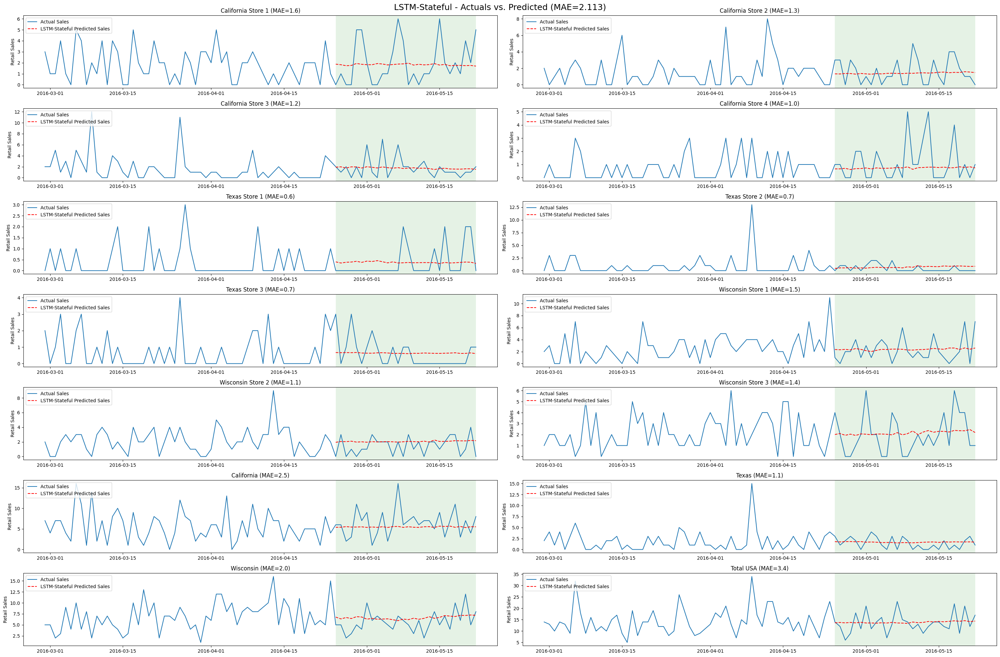

In [70]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>2. Temporal Fusion Transformer with PyTorch</h2>
</div>

<div>
<img src="images/tft-architecture.png" width="800"/>
</div>
<br>
<center>Figure: Temporal Fusion Transformer Architecture</center>

The **Temporal Fusion Transformer (TFT)** is a state-of-the-art deep learning model designed for time series forecasting. It combines two crucial components: the Transformer encoder and the Temporal Fusion Decoder (TF-Decoder).

**Key Features**

- *Transformer Encoder*: The Transformer encoder processes input time series data using multi-head self-attention mechanisms, enabling it to effectively capture temporal dependencies within the sequential data.


- *TF-Decoder*: The key innovation lies in the TF-Decoder, which extends the traditional Transformer decoder to handle time series forecasting. It incorporates an autoregressive mechanism, predicting future values step by step. This approach allows the model to consider its past predictions as input for subsequent forecasts, improving accuracy.


- *Temporal Embeddings*: Temporal embeddings are utilized to incorporate time-related information, helping the model capture patterns at different time intervals (e.g., hourly, daily, weekly). This is essential for capturing seasonalities and other temporal patterns in the data.


- *Exogenous Inputs*: Moreover, TFT can handle exogenous inputs, which are additional features relevant to the forecasting task. These inputs are combined with temporal embeddings to provide the model with extra context, making it more versatile and capable of forecasting in diverse scenarios.


By combining these features, the Temporal Fusion Transformer has achieved remarkable results, outperforming traditional time series forecasting approaches in various domains.

<div>
<img src="images/tft-attention.png" width="800"/>
</div>
<br>
<center>Figure: Temporal Fusion Transformer appears to alter its behaviour between regimes – placing equal attention across past inputs when volatility is low, while attending more to sharp trend changes during high volatility periods – suggesting differences in temporal dynamics learned in each of these cases</center>

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Configuration</h3>
</div>

In [71]:
#Overall
max_encoder_length = 24
batch_size = 128  # set this between 32 to 128
seed = 42

#Hyperparameters
learning_rate=0.03
hidden_size=8  # most important hyperparameter apart from learning rate - hidden size of network which is its main hyperparameter and can range from 8 to 512
attention_head_size=2 # number of attention heads. Set to up to 4 for large datasets
dropout=0.1  # between 0.1 and 0.3 are good values
hidden_continuous_size=8  # set to <= hidden_size - default for hidden size for processing continous variables (similar to categorical embedding size)
optimizer = "Ranger" #Rectified Adam + LookAhead Optimizer - RAdam stabilizes training at the start, LookAhead stabilizes training and convergence during the rest of training
max_lr=10.0 #for tuning lr
min_lr=1e-6 #for tuning lr
reduce_on_plateau_patience=4 # reduce learning rate if no improvement in validation loss after x epochs

#Trainer hyperparameters
max_epochs = 100
gradient_clip_val=0.1
limit_train_batches=50

#Define algorithm
algorithm = 'TemporalFusionTransformer'

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Data Preprocessing</h3>
</div>

In [72]:
training_tft_cutoff = training_df["time_idx"].max() - prediction_length
training_df_tft = training_df[lambda x: x.time_idx <= training_tft_cutoff]
validation_df_tft = training_df[lambda x: x.time_idx > training_tft_cutoff]

In [73]:
#Create Dataset and Dataloaders
training = TimeSeriesDataSet(
    training_df_tft,
    time_idx="time_idx",
    target="y",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length // 2,  # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_encoder_length,
    min_prediction_length=1,
    max_prediction_length=prediction_length,
    static_categoricals=["group_id"],
    time_varying_known_categoricals=["special_days","month"],
    variable_groups={"special_days": special_days},  # group of categorical variables can be treated as one variable
    time_varying_known_reals=["time_idx", "sell_price"],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=[
        "y",
        "log_sales",
        "avg_sales_by_group"
    ],
    target_normalizer=GroupNormalizer(
        groups=["group_id"], transformation="softplus"
    ),  # use softplus and normalize by group
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(training, training_df_tft, predict=True, stop_randomization=True)

# create dataloaders for model
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Create Baseline Model</h3>
</div>

In [74]:
# calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
baseline_predictions = Baseline().predict(val_dataloader, return_y=True)
MAE()(baseline_predictions.output, baseline_predictions.y)

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


tensor(1.9617)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Train the Temporal Fusion Transformer</h3>
</div>

In [75]:
# configure network and trainer
pl.seed_everything(seed)
trainer = pl.Trainer(
    accelerator="cpu",
    # clipping gradients is a hyperparameter and important to prevent divergence
    # of the gradient for recurrent neural networks
    gradient_clip_val=gradient_clip_val
)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=learning_rate,
    hidden_size=hidden_size,
    attention_head_size=attention_head_size,
    dropout=dropout,
    hidden_continuous_size=hidden_continuous_size,
    loss=QuantileLoss(),
    optimizer=optimizer
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO: Global seed set to 42
INFO:lightning.fabric.utilities.seed:Global seed set to 42
INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 9.5k


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=100` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.09332543007969905
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.09332543007969905
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_bcc2058d-4f10-4f53-9f89-f759e2df4909.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_bcc2058d-4f10-4f53-9f89-f759e2df4909.ckpt
INFO: Restored all states from the checkpoint at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_bcc2058d-4f10-4f53-9f89-f759e2df4909.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_bcc2058d-4f10-4f53-9f89-f759e2df4909.ckpt


suggested learning rate: 0.09332543007969905


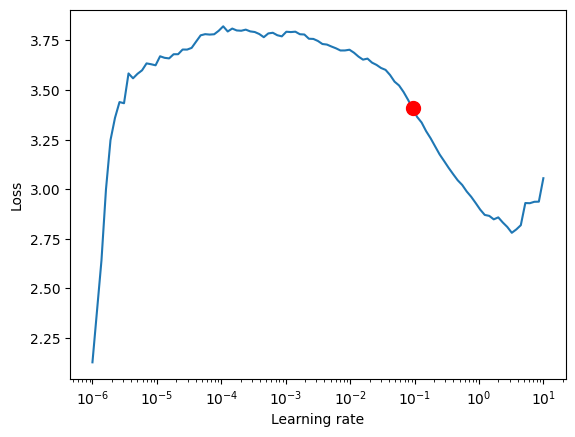

In [76]:
# find optimal learning rate
res = Tuner(trainer).lr_find(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=max_lr,
    min_lr=min_lr,
)

print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

In [77]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=max_epochs,
    accelerator="cpu",
    enable_model_summary=True,
    gradient_clip_val=gradient_clip_val,
    limit_train_batches=limit_train_batches,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=res.suggestion(),
    hidden_size=2*hidden_size,
    attention_head_size=attention_head_size,
    dropout=dropout,
    hidden_continuous_size=hidden_continuous_size,
    loss=QuantileLoss(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer=optimizer,
    reduce_on_plateau_patience=reduce_on_plateau_patience
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 22.5k


In [78]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

INFO: 
   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 511   
3  | prescalers                         | ModuleDict                      | 144   
4  | static_variable_selection          | VariableSelectionNetwork        | 1.8 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 4.2 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 2.1 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm   | GatedResidualNetwork            

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Evaluation of Performance</h3>
</div>

In [79]:
#Create Dataset and Dataloaders
training_all = TimeSeriesDataSet(
    training_df,
    time_idx="time_idx",
    target="y",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length // 2,  # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_encoder_length,
    min_prediction_length=1,
    max_prediction_length=prediction_length,
    static_categoricals=["group_id"],
    time_varying_known_categoricals=["special_days","month"],
    variable_groups={"special_days": special_days},  # group of categorical variables can be treated as one variable
    time_varying_known_reals=["time_idx", "sell_price"],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=[
        "y",
        "log_sales",
        "avg_sales_by_group"
    ],
    target_normalizer=GroupNormalizer(
        groups=["group_id"], transformation="softplus"
    ),  # use softplus and normalize by group
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
test = TimeSeriesDataSet.from_dataset(training_all, data, predict=True, stop_randomization=True)

# create dataloaders for model
test_dataloader = test.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

In [80]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

In [81]:
# Get predictions for test set
predictions = best_tft.predict(test_dataloader, return_y=True,trainer_kwargs=dict(accelerator="cpu"))

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [82]:
#Get groups as used by TFT
groups_tft = np.sort(group_ids_ls).tolist()
groups_tft

['CA',
 'CA_1',
 'CA_2',
 'CA_3',
 'CA_4',
 'TX',
 'TX_1',
 'TX_2',
 'TX_3',
 'Total',
 'WI',
 'WI_1',
 'WI_2',
 'WI_3']

In [83]:
#Get indices of hierarchies
idx_country = [groups_tft.index(i) for i in tags["Country"]]
idx_state = [groups_tft.index(i) for i in tags["Country/State"]]
idx_store = [groups_tft.index(i) for i in tags["Country/State/Store"]]

In [84]:
#Get MAE
error_country  = np.round(float(MAE()(torch.index_select(predictions.output, 0, torch.tensor(idx_country)), 
                                      torch.index_select(predictions.y[0], 0, torch.tensor(idx_country)))),3)

error_state  = np.round(float(MAE()(torch.index_select(predictions.output, 0, torch.tensor(idx_state)), 
                                      torch.index_select(predictions.y[0], 0, torch.tensor(idx_state)))),3)

error_store  = np.round(float(MAE()(torch.index_select(predictions.output, 0, torch.tensor(idx_store)), 
                                      torch.index_select(predictions.y[0], 0, torch.tensor(idx_store)))),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == algorithm,["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,0.000,0.000,0.000,0.000
4,Non-Hierarchical,DeepAR,0.000,0.000,0.000,0.000
5,Non-Hierarchical,BHM-Nixtla-Pooled,0.000,0.000,0.000,0.000
6,Hierarchical,BHM-Nixtla-BottomUp,0.000,0.000,0.000,0.000
7,Hierarchical,BHM-Nixtla-TopDown,0.000,0.000,0.000,0.000
8,Hierarchical,BHM-Nixtla-MiddleOut,0.000,0.000,0.000,0.000
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


In [85]:
#Get dataframe for actuals vs. predicted
for i, group_id in enumerate(groups_tft):
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = torch.index_select(predictions.output, 0, torch.tensor([i]))[0].tolist()
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

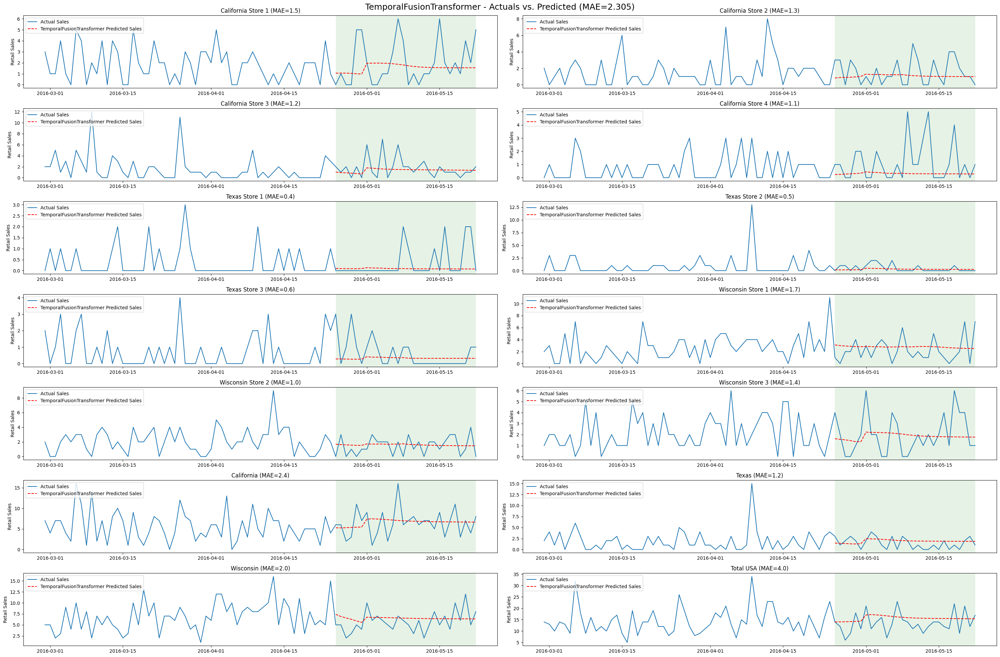

In [86]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>3. NeuralProphet</h2>
</div>

<div>
<img src="images/neuralprophet.png" width="800"/>
</div>
<br>
<center>Figure: NeuralProphet vs. Prophet</center>


**NeuralProphet** is a time series forecasting algorithm developed by Oskar Triebe and colleagues. It combines the power of neural networks with the forecasting capabilities of the classical Prophet algorithm. The algorithm is designed to handle various time series forecasting tasks and has gained popularity for its accuracy and ease of use.

**Key Features**

- *Neural Network Architecture*: NeuralProphet employs a neural network model, specifically a feedforward neural network, for time series forecasting. The network is designed to capture complex patterns and dependencies in the data.


- *Trend and Seasonality*: Similar to the original Prophet algorithm, NeuralProphet explicitly models trends and seasonality in the time series data, allowing it to capture long-term patterns and seasonal fluctuations.


- *Autoregression*: NeuralProphet incorporates autoregressive components, enabling it to make predictions based on past values in the time series. This feature is crucial for accurate forecasting, especially in cases where the data exhibits strong temporal dependencies.


- *Exogenous Variables*: The algorithm supports the inclusion of exogenous variables, allowing users to provide additional external features that can improve forecasting performance by providing extra context.


- *Flexible Model Configuration*: NeuralProphet provides users with an easy-to-use interface to configure and fine-tune various hyperparameters, making it accessible to both beginners and experienced data scientists.


- *Uncertainty Estimation*: The algorithm also provides uncertainty estimation for its predictions, offering prediction intervals that indicate the confidence in the forecasted values.

NeuralProphet is particularly well-suited for time series forecasting tasks in various domains, including finance, e-commerce, and demand forecasting. Its combination of neural networks and classical forecasting techniques, along with its ability to handle trends, seasonality, and exogenous variables, makes it a valuable tool for accurate and reliable predictions.

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Configuration</h3>
</div>

In [87]:
#Hyperparameters
n_lags = 10
quantiles = [0.05, 0.95]

#Define algorithm
algorithm = 'NeuralProphet'

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Create Baseline Model</h3>
</div>

In [88]:
tmp_predictions_df = pd.DataFrame()

In [89]:
error_ls = []
for group_id in group_ids_ls:

    training_df_sub = training_df.loc[training_df.group_id == group_id, :]
    validation_df_sub = validation_df.loc[validation_df.group_id == group_id, :]

    m = NeuralProphet()
    m.set_plotting_backend("plotly-static")  # show plots correctly in jupyter notebooks
    metrics = m.fit(training_df_sub[["ds","y"]])

    predicted = m.predict(training_df_sub[["ds","y"]])
    forecast = m.predict(validation_df_sub[["ds","y"]])
    
    #Get MAE
    mae_val = np.round(mean_absolute_error(forecast["y"],forecast["yhat1"]),3)
    print(group_id,mae_val)
    
    #Store the errors
    error_ls.append(mae_val)
    
    #Save predictions 
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = forecast.dropna()["yhat1"].values
    sub_predictions_df["algorithm"] = algorithm
    tmp_predictions_df = pd.concat([tmp_predictions_df,sub_predictions_df],axis=0)

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.co

Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5294f33a-7875-4f90-baa4-482ba5fd4b16.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5294f33a-7875-4f90-baa4-482ba5fd4b16.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5294f33a-7875-4f90-baa4-482ba5fd4b16.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5294f33a-7875-4f90-baa4-482ba5fd4b16.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA_1 1.968


INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (60) is too small than the required number                     for the learning rate finder (232). The results might not be optimal.
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_dataloader` to estimate number of stepping batches.


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_d956eb0e-888e-4aa3-8110-f9425828e380.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_d956eb0e-888e-4aa3-8110-f9425828e380.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_d956eb0e-888e-4aa3-8110-f9425828e380.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_d956eb0e-888e-4aa3-8110-f9425828e380.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA_2 1.54


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_f9f7324e-4f52-48f6-bad8-8531fdf05788.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_f9f7324e-4f52-48f6-bad8-8531fdf05788.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_f9f7324e-4f52-48f6-bad8-8531fdf05788.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_f9f7324e-4f52-48f6-bad8-8531fdf05788.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA_3 1.273


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ded9186d-831f-4c47-91c0-a4a71407948b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ded9186d-831f-4c47-91c0-a4a71407948b.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ded9186d-831f-4c47-91c0-a4a71407948b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ded9186d-831f-4c47-91c0-a4a71407948b.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA_4 1.061


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_cf7850a1-5c5d-4846-baca-3e5f8c93400b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_cf7850a1-5c5d-4846-baca-3e5f8c93400b.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_cf7850a1-5c5d-4846-baca-3e5f8c93400b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_cf7850a1-5c5d-4846-baca-3e5f8c93400b.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

TX_1 0.689


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_2d47a8ad-bb4b-41e8-bb23-e8ce341565bc.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_2d47a8ad-bb4b-41e8-bb23-e8ce341565bc.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_2d47a8ad-bb4b-41e8-bb23-e8ce341565bc.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_2d47a8ad-bb4b-41e8-bb23-e8ce341565bc.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

TX_2 1.032


INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (60) is too small than the required number                     for the learning rate finder (232). The results might not be optimal.
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_dataloader` to estimate number of stepping batches.


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_39eccc9c-79ea-4678-bcbe-5b9654fff2c1.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_39eccc9c-79ea-4678-bcbe-5b9654fff2c1.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_39eccc9c-79ea-4678-bcbe-5b9654fff2c1.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_39eccc9c-79ea-4678-bcbe-5b9654fff2c1.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

TX_3 0.712


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_54e3361b-142b-42f0-9696-960ad778ce7c.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_54e3361b-142b-42f0-9696-960ad778ce7c.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_54e3361b-142b-42f0-9696-960ad778ce7c.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_54e3361b-142b-42f0-9696-960ad778ce7c.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

WI_1 1.611


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_90aa9e23-74d0-40bb-8d19-addfd0197c73.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_90aa9e23-74d0-40bb-8d19-addfd0197c73.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_90aa9e23-74d0-40bb-8d19-addfd0197c73.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_90aa9e23-74d0-40bb-8d19-addfd0197c73.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

WI_2 1.106


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_31693637-5c52-4fae-b2a1-a6f3f0642ef2.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_31693637-5c52-4fae-b2a1-a6f3f0642ef2.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_31693637-5c52-4fae-b2a1-a6f3f0642ef2.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_31693637-5c52-4fae-b2a1-a6f3f0642ef2.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

WI_3 1.392


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_7884e6bb-9a73-4597-aabc-4c2a32fa9b70.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_7884e6bb-9a73-4597-aabc-4c2a32fa9b70.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_7884e6bb-9a73-4597-aabc-4c2a32fa9b70.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_7884e6bb-9a73-4597-aabc-4c2a32fa9b70.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA 3.114


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_636933ab-1633-4538-8a1d-0be94e82d8ae.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_636933ab-1633-4538-8a1d-0be94e82d8ae.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_636933ab-1633-4538-8a1d-0be94e82d8ae.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_636933ab-1633-4538-8a1d-0be94e82d8ae.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

TX 1.764


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_70db3f38-28b4-441f-9af2-ed1cbe4366ec.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_70db3f38-28b4-441f-9af2-ed1cbe4366ec.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_70db3f38-28b4-441f-9af2-ed1cbe4366ec.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_70db3f38-28b4-441f-9af2-ed1cbe4366ec.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

WI 1.929


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ced276b0-2a01-4db5-b256-910b49e985a5.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ced276b0-2a01-4db5-b256-910b49e985a5.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ced276b0-2a01-4db5-b256-910b49e985a5.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ced276b0-2a01-4db5-b256-910b49e985a5.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 96.429% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 96.429% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


Total 5.349


In [90]:
#Get MAE
error_country  = np.round(error_ls[13],3)
error_state  = np.round(np.mean(error_ls[10:13]),3)
error_store  = np.round(np.mean(error_ls[:10]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
print(error_country,error_state,error_store,error_overall)

5.349 2.269 1.238 2.952


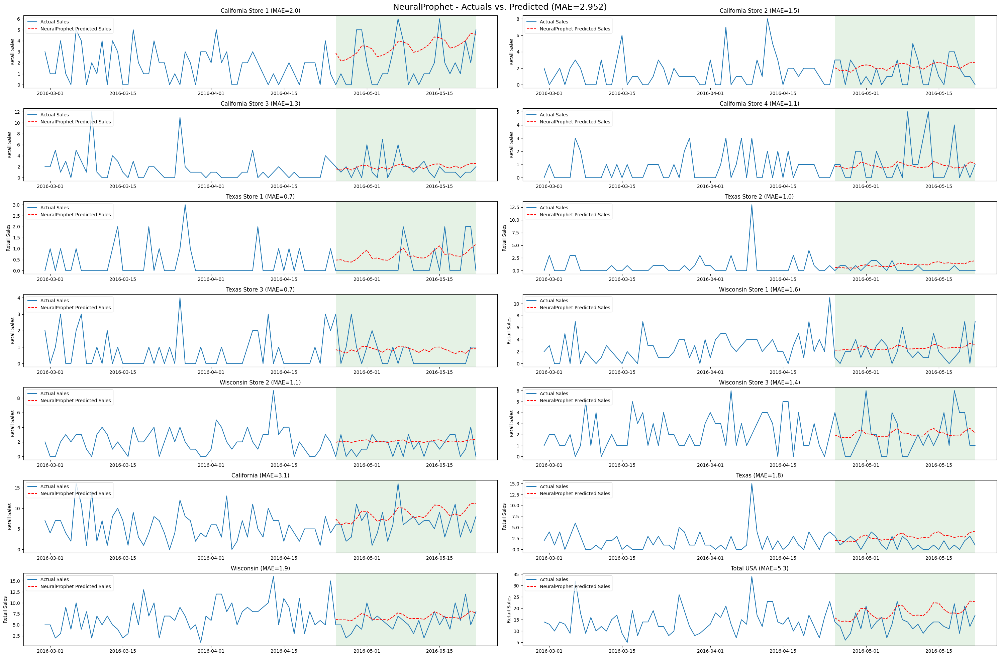

In [91]:
#Get actuals vs. predicted
get_actsvspred(algorithm, tmp_predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Improve the NeuralProphet Model</h3>
</div>

The model can be improved by adding additional features such as auto-regression and uncertainty.

Here we add auto-regression terms and uncertainty to the model. The number of terms can be specified by the n_lags argument. Uncertainty intervals can be added by setting the quantiles argument.

**Uncertainty quantification** is a salient statistical technique to include uncertainty in the model training process so to provide a more accurate and reliable output for users.

The **quantile regression** module allows the algorithm to learn only a certain quantile of output variables for each instance. Once the quantile regression module is added on a model, NeuralProphet uses the **pinball loss (quantile loss)** function to assess goodness-of-fit of the trained model. Similiar to how log-likelihood loss function is used for Gaussian linear regression.

Instead of taking the absolute error in, pinball loss function has different error weightings for each different quantile. We usually take an upper quantile exceeding 50th percentile as the upper bound of prediction interval and another lower quantile below 50th percentile as the lower bound of interval. When the actual output lays outside the prediction interval, the loss function assigns a heavier weight for the absolute error and vice versa. We eventually minimise the loss function by adjusting the parameters of the quantile line iteratively.

In [92]:
error_ls_imp = []
for group_id in group_ids_ls:
    
    training_df_sub = training_df.loc[training_df.group_id == group_id, :]
    validation_df_sub = data.loc[data.group_id == group_id, :].tail(prediction_length+n_lags)
    
    m_imp = NeuralProphet(n_lags=n_lags, quantiles=quantiles)
    m_imp.set_plotting_backend("plotly-static")
    metrics = m_imp.fit(training_df_sub[["ds","y"]])
    
    forecast = m_imp.predict(validation_df_sub[["ds","y"]])
    
    #Get MAE
    mae_val = np.round(mean_absolute_error(forecast.dropna()["y"],forecast.dropna()["yhat1"]),3)
    print(group_id,mae_val)
    
    #Store the errors
    error_ls_imp.append(mae_val)
    
    #Save predictions 
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = forecast.dropna()["yhat1"].values
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.co

Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_14752d91-930d-4e56-9ec8-43f9eaa87df6.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_14752d91-930d-4e56-9ec8-43f9eaa87df6.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_14752d91-930d-4e56-9ec8-43f9eaa87df6.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_14752d91-930d-4e56-9ec8-43f9eaa87df6.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA_1 1.592


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_9b7f0db6-bd60-4e93-b617-eb4d96cbc8c2.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_9b7f0db6-bd60-4e93-b617-eb4d96cbc8c2.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_9b7f0db6-bd60-4e93-b617-eb4d96cbc8c2.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_9b7f0db6-bd60-4e93-b617-eb4d96cbc8c2.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA_2 1.519


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5b703aeb-f76d-41ae-af12-db941681667e.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5b703aeb-f76d-41ae-af12-db941681667e.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5b703aeb-f76d-41ae-af12-db941681667e.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5b703aeb-f76d-41ae-af12-db941681667e.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA_3 1.263


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5a039b49-45f5-4715-9e03-f7e05a28a90d.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5a039b49-45f5-4715-9e03-f7e05a28a90d.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5a039b49-45f5-4715-9e03-f7e05a28a90d.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_5a039b49-45f5-4715-9e03-f7e05a28a90d.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA_4 1.084


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_4a1d44ce-939b-45db-bfb9-939abf5eb13b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_4a1d44ce-939b-45db-bfb9-939abf5eb13b.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_4a1d44ce-939b-45db-bfb9-939abf5eb13b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_4a1d44ce-939b-45db-bfb9-939abf5eb13b.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

TX_1 0.567


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_99cf964b-be29-4e54-955d-aa357ec61493.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_99cf964b-be29-4e54-955d-aa357ec61493.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_99cf964b-be29-4e54-955d-aa357ec61493.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_99cf964b-be29-4e54-955d-aa357ec61493.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

TX_2 0.806


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ec77a40a-899e-4182-954b-3ad38572adc4.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ec77a40a-899e-4182-954b-3ad38572adc4.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ec77a40a-899e-4182-954b-3ad38572adc4.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_ec77a40a-899e-4182-954b-3ad38572adc4.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

TX_3 0.69


INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (60) is too small than the required number                     for the learning rate finder (232). The results might not be optimal.
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_dataloader` to estimate number of stepping batches.


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_b87ed8fb-a7c1-46b0-b3c4-3f5b57c1e34b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_b87ed8fb-a7c1-46b0-b3c4-3f5b57c1e34b.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_b87ed8fb-a7c1-46b0-b3c4-3f5b57c1e34b.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_b87ed8fb-a7c1-46b0-b3c4-3f5b57c1e34b.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

WI_1 1.696


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_679ee1df-d000-43b2-8d13-9bfe959cfb7c.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_679ee1df-d000-43b2-8d13-9bfe959cfb7c.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_679ee1df-d000-43b2-8d13-9bfe959cfb7c.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_679ee1df-d000-43b2-8d13-9bfe959cfb7c.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

WI_2 1.099


INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_dataloader` to estimate number of stepping batches.


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_387ed531-262e-49cd-8dfe-0f3f7f56fab0.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_387ed531-262e-49cd-8dfe-0f3f7f56fab0.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_387ed531-262e-49cd-8dfe-0f3f7f56fab0.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_387ed531-262e-49cd-8dfe-0f3f7f56fab0.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

WI_3 1.378


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_08d98d69-3c14-4f10-98e3-2589d25b8dd6.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_08d98d69-3c14-4f10-98e3-2589d25b8dd6.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_08d98d69-3c14-4f10-98e3-2589d25b8dd6.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_08d98d69-3c14-4f10-98e3-2589d25b8dd6.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

CA 2.553


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_2f99ff3b-4970-4c5b-90b5-30d69015dec7.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_2f99ff3b-4970-4c5b-90b5-30d69015dec7.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_2f99ff3b-4970-4c5b-90b5-30d69015dec7.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_2f99ff3b-4970-4c5b-90b5-30d69015dec7.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

TX 1.278


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_4267f2a2-1804-4c6a-88dd-698801fd0a45.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_4267f2a2-1804-4c6a-88dd-698801fd0a45.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_4267f2a2-1804-4c6a-88dd-698801fd0a45.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_4267f2a2-1804-4c6a-88dd-698801fd0a45.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to overri

WI 1.927


INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (60) is too small than the required number                     for the learning rate finder (232). The results might not be optimal.
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_dataloader` to estimate number of stepping batches.


Finding best initial lr:   0%|          | 0/232 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_steps=232` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=232` reached.
INFO: Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_f1f7473b-6a3f-4bb7-a022-2167ebf55893.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_f1f7473b-6a3f-4bb7-a022-2167ebf55893.ckpt
INFO: Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_f1f7473b-6a3f-4bb7-a022-2167ebf55893.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restored all states from the checkpoint file at /Users/anantagarwal/Desktop/Final-DataHack-Summit-Material/.lr_find_f1f7473b-6a3f-4bb7-a022-2167ebf55893.ckpt
INFO: Loading `train_dataloader` to estimate number of stepping batches.
INFO:lightning.pytorch.utilities.rank_zero:Loading `train_

Training: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=160` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=160` reached.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.368% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.368% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 97.436% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 97.436% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 1 rows at the end with NaNs in 'y' column.
INFO:NP.data.processing:Dropped 1 rows at the end with NaNs in 'y' column.


Predicting: 60it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


Total 3.725


<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Evaluation of Performance</h3>
</div>

In [93]:
#Get MAE
error_country  = np.round(error_ls_imp[13],3)
error_state  = np.round(np.mean(error_ls_imp[10:13]),3)
error_store  = np.round(np.mean(error_ls_imp[:10]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == "NeuralProphet",["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,3.725,1.919,1.169,2.271
4,Non-Hierarchical,DeepAR,0.000,0.000,0.000,0.000
5,Non-Hierarchical,BHM-Nixtla-Pooled,0.000,0.000,0.000,0.000
6,Hierarchical,BHM-Nixtla-BottomUp,0.000,0.000,0.000,0.000
7,Hierarchical,BHM-Nixtla-TopDown,0.000,0.000,0.000,0.000
8,Hierarchical,BHM-Nixtla-MiddleOut,0.000,0.000,0.000,0.000
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


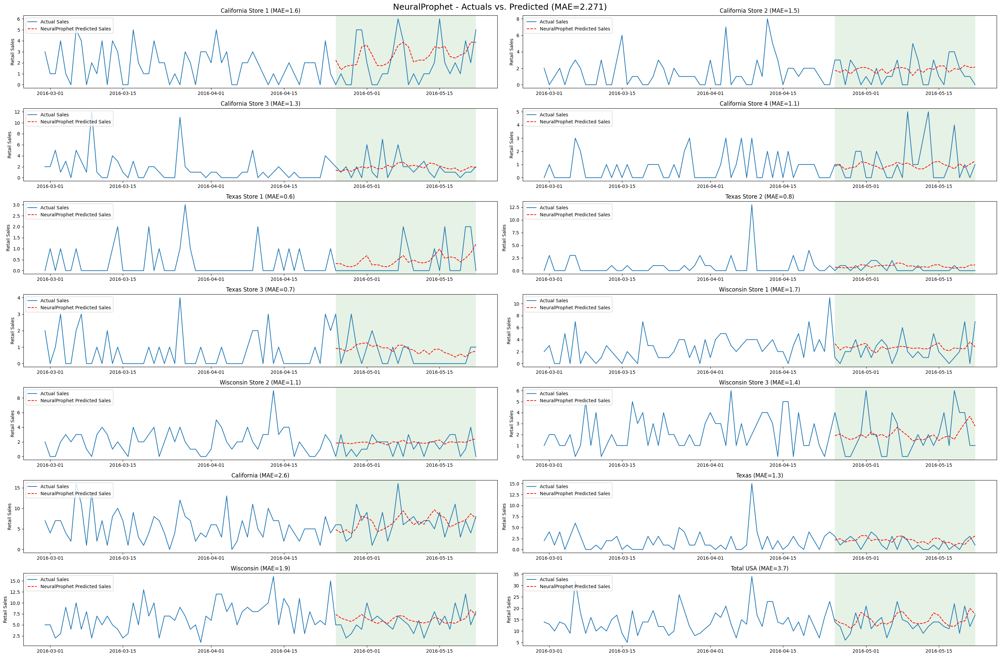

In [94]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Plots for Country Model</h3>
</div>

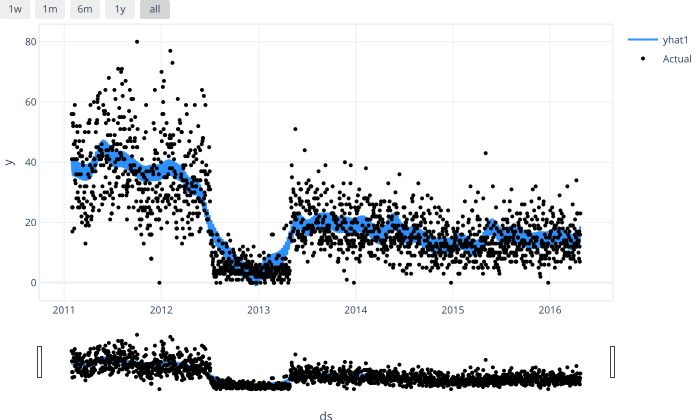

In [95]:
m.plot(predicted)

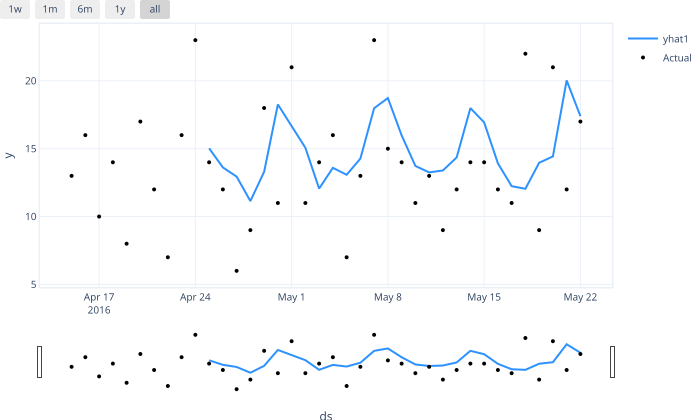

In [96]:
m.plot(forecast)

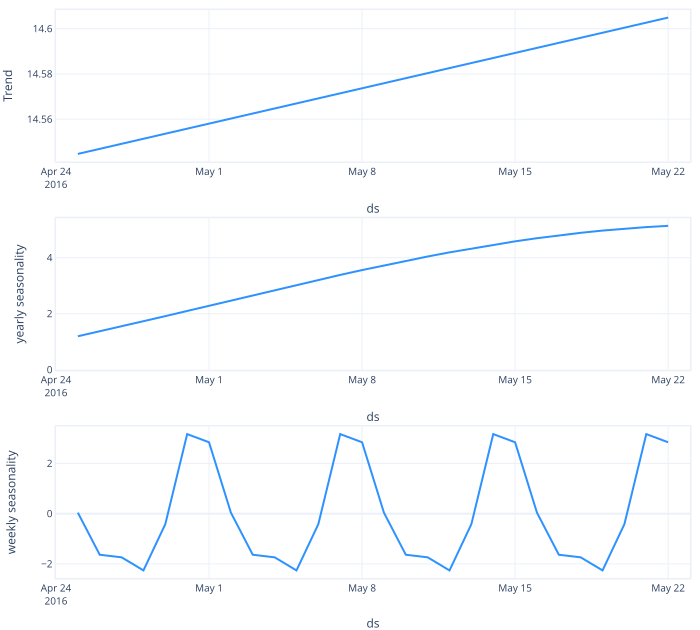

In [97]:
m.plot_components(forecast)

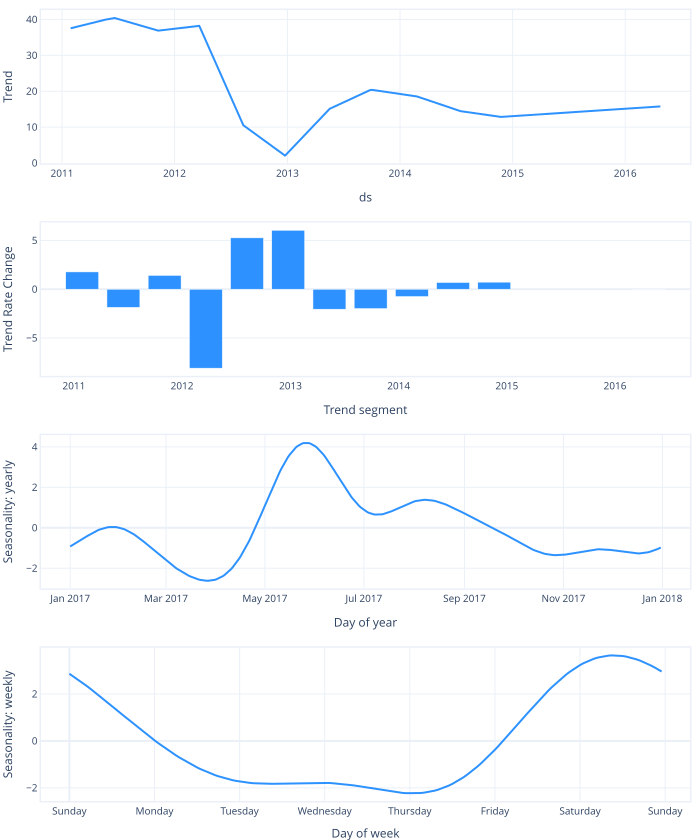

In [98]:
m.plot_parameters()

After specifiying tbe forecast step, we can plot the forecast for the improved model.

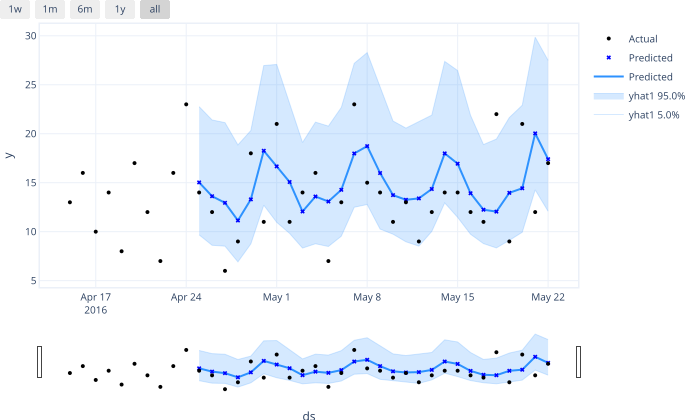

In [99]:
m_imp.highlight_nth_step_ahead_of_each_forecast(1).plot(forecast)

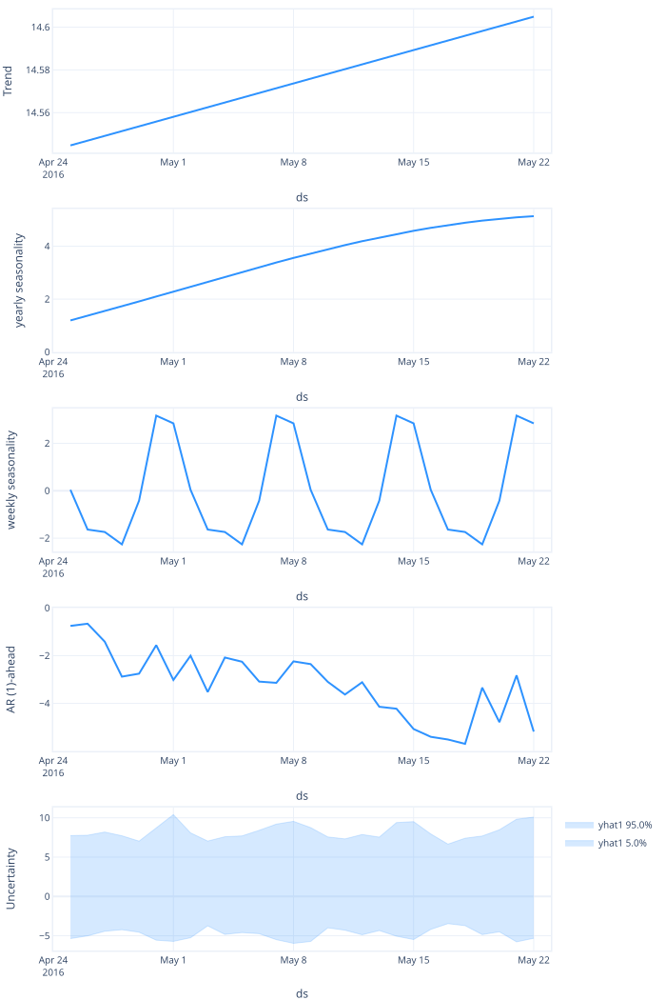

In [100]:
m_imp.plot_components(forecast)

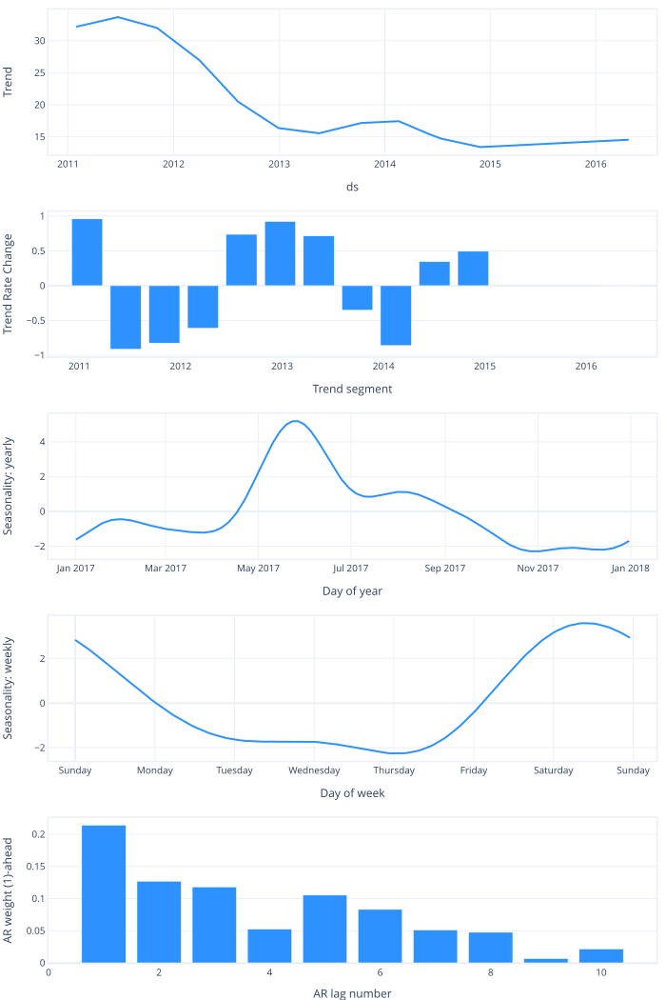

In [101]:
m_imp.plot_parameters()

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>4. DeepAR with GluonTS</h2>
</div>

<div>
<img src="images/deepar.png" width="800"/>
</div>
<br>
<center>Figure: DeepAR Architecture</center>


**Amazon's DeepAR** is a state-of-the-art probabilistic forecasting algorithm designed for time series data. Developed by David Salinas, Valentin Flunkert, and Jan Gasthaus, DeepAR is based on recurrent neural networks (RNNs) and is part of the Amazon SageMaker platform. DeepAR relies on one fundamental idea: Instead of fitting separate models for each time series, it aims to create a global model that learns using all time series in the dataset.

**Key Features**

- *Recurrent Neural Networks (RNNs)*: DeepAR utilizes RNNs, specifically the Long Short-Term Memory (LSTM) variant, to capture temporal dependencies and patterns in time series data. LSTM cells are well-suited for handling sequential data and are capable of modeling long-term dependencies.


- *Probabilistic Forecasting*: DeepAR employs a probabilistic forecasting approach, which means it generates prediction intervals instead of point estimates. This provides a measure of uncertainty, allowing decision-makers to understand the range of potential outcomes.


- *Autoregressive Modeling*: The algorithm is autoregressive, meaning it uses its past predictions as inputs for future predictions, enabling it to capture feedback loops and complex relationships within the data.


- *Seasonality Handling*: DeepAR can automatically detect and model multiple seasonalities present in the time series data, making it effective for capturing periodic patterns.


- *Training with Multiple Time Series*: One of the notable strengths of DeepAR is its ability to handle training with multiple related time series simultaneously. This multi-series training allows the model to leverage information from related series to improve forecasting accuracy.


- *Customizable Loss Function*: The algorithm allows users to customize the loss function to suit specific forecasting tasks and objectives.

**Why it stands out**

- *Multiple time-series support*: Trained on multiple time-series, enhancing forecasting accuracy through learning global characteristics.
- *Extra covariates*:Supports extra covariates, such as humidity levels and air pressure, for more comprehensive forecasting tasks.
- *Probabilsitic output*: Utilizes quantile loss to produce probabilistic output with prediction intervals instead of single predictions.
- "*Cold*" *forecasting*: Enables "cold" forecasting for time-series with limited or no historical data by leveraging knowledge from related time-series.


DeepAR has demonstrated impressive performance on various time series forecasting tasks, particularly in retail demand forecasting, financial predictions, and supply chain management. By combining the power of RNNs with probabilistic forecasting, DeepAR offers a powerful tool for generating accurate and reliable forecasts with uncertainty estimates, making it highly valuable for decision-making in business and industry settings.

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Configuration</h3>
</div>

In [102]:
#Hyperparameters
learning_rate=1e-3
epochs=100
num_batches_per_epoch=50

algorithm = 'DeepAR'

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Data Preprocessing</h3>
</div>

The test dataset is an extended version of the train dataset that contains a window in the end of each time series that was not seen during training. This window has length equal to the recommended prediction length.

In [103]:
#Modifying values of special days
proc_training_df = training_df.copy(deep=True)
proc_validation_df = pd.concat([training_df,validation_df],axis=0).copy(deep=True)

for special_day in special_days:
    proc_training_df[special_day] = proc_training_df[special_day].replace({"-":0,special_day:1}).astype(int)
    proc_validation_df[special_day] = proc_validation_df[special_day].replace({"-":0,special_day:1}).astype(int)

In [104]:
for i,group_id in enumerate(group_ids_ls):
    if i == 0:
        train_features = np.expand_dims(np.array(proc_training_df.loc[proc_training_df.group_id == group_id, feature_cols]).T,axis=0)
        val_features = np.expand_dims(np.array(proc_validation_df.loc[proc_validation_df.group_id == group_id, feature_cols]).T,axis=0)
    else:
        train_features = np.append(np.expand_dims(np.array(proc_training_df.loc[proc_training_df.group_id == group_id, feature_cols]).T,axis=0),
                  train_features,axis=0)
        val_features = np.append(np.expand_dims(np.array(proc_validation_df.loc[proc_validation_df.group_id == group_id, feature_cols]).T,axis=0),
                  val_features,axis=0)

In [105]:
print(train_features.shape,val_features.shape)

(14, 31, 1913) (14, 31, 1941)


We then go on to build static features (features which are constant and series-specific). Here, we make use of all categorical features that are provided to us as part of the M5 data.

In [106]:
group_ids = np.arange(0,len(group_ids_ls))
group_ids_un , group_ids_counts = np.unique(group_ids, return_counts=True)

stat_cat_list = [group_ids]

stat_cat = np.concatenate(stat_cat_list)
stat_cat = stat_cat.reshape(-1,1)

stat_cat_cardinalities = [len(group_ids_un)]

Finally, we can build both the training and the testing set from target values and both static and dynamic features.

In [107]:
train_df = proc_training_df.pivot_table(columns="time_idx",index="group_id",values="y").loc[group_ids_ls]
train_target_values = train_df.values

val_df = proc_validation_df.pivot_table(columns="time_idx",index="group_id",values="y").loc[group_ids_ls]
val_target_values = val_df.values

m5_dates = [pd.Timestamp("2011-01-29", freq='1D') for _ in range(len(group_ids_ls))]

train_ds = ListDataset([
    {
        FieldName.TARGET: target,
        FieldName.START: start,
        FieldName.FEAT_DYNAMIC_REAL: fdr,
        FieldName.FEAT_STATIC_CAT: fsc
    }
    for (target, start, fdr, fsc) in zip(train_target_values,
                                         m5_dates,
                                         train_features,
                                         stat_cat)
], freq="D")

val_ds = ListDataset([
    {
        FieldName.TARGET: target,
        FieldName.START: start,
        FieldName.FEAT_DYNAMIC_REAL: fdr,
        FieldName.FEAT_STATIC_CAT: fsc
    }
    for (target, start, fdr, fsc) in zip(val_target_values,
                                         m5_dates,
                                         val_features,
                                         stat_cat)
], freq="D")

Just to be sure, we quickly verify that dataset format is correct and that our dataset does indeed contain the correct target values as well as dynamic and static features.

In [108]:
next(iter(train_ds))

{'target': array([3., 7., 4., ..., 0., 4., 1.], dtype=float32),
 'start': Period('2011-01-29', 'D'),
 'feat_dynamic_real': array([[0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
        ...,
        [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
        [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
        [1.98, 1.98, 1.98, ..., 1.98, 1.98, 1.98]], dtype=float32),
 'feat_static_cat': array([0], dtype=int32)}

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Train the DeepAR Model</h3>
</div>

Having obtained our training and testing data, we can now create a GluonTS estimator. In our example we will use the `DeepAREstimator`, an autoregressive RNN which was developed primarily for the purpose of time series forecasting. Note however that you can use a variety of different estimators. Also, since GluonTS is mainly target at probabilistic time series forecasting, lots of different output distributions can be specified. In the M5 case, we think that the `NegativeBinomialOutput` distribution best describes the output.

For a full list of available estimators and possible initialization arguments see https://ts.gluon.ai/stable/getting_started/models.html

For a full list of available output distributions and possible initialization arguments see https://ts.gluon.ai/stable/api/gluonts/gluonts.mx.distribution.html

In [109]:
estimator = DeepAREstimator(
    prediction_length=prediction_length,
    freq="D",
    distr_output = NegativeBinomialOutput(),
    use_feat_dynamic_real=True,
    use_feat_static_cat=True,
    cardinality=stat_cat_cardinalities,
    trainer=Trainer(
        learning_rate=learning_rate,
        epochs=epochs,
        num_batches_per_epoch=num_batches_per_epoch,
    )
)

predictor = estimator.train(train_ds)

INFO:gluonts.trainer:Start model training
INFO:gluonts.trainer:Epoch[0] Learning rate is 0.001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 13.72it/s, epoch=1/100, avg_epoch_loss=2.07]
INFO:gluonts.trainer:Epoch[0] Elapsed time 3.649 seconds
INFO:gluonts.trainer:Epoch[0] Evaluation metric 'epoch_loss'=2.068218
INFO:gluonts.trainer:Epoch[1] Learning rate is 0.001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.80it/s, epoch=2/100, avg_epoch_loss=1.92]
INFO:gluonts.trainer:Epoch[1] Elapsed time 3.167 seconds
INFO:gluonts.trainer:Epoch[1] Evaluation metric 'epoch_loss'=1.923709
INFO:gluonts.trainer:Epoch[2] Learning rate is 0.001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.58it/s, epoch=3/100, avg_epoch_loss=1.91]
INFO:gluonts.t

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.73it/s, epoch=23/100, avg_epoch_loss=1.79]
INFO:gluonts.trainer:Epoch[22] Elapsed time 3.179 seconds
INFO:gluonts.trainer:Epoch[22] Evaluation metric 'epoch_loss'=1.794926
INFO:gluonts.trainer:Epoch[23] Learning rate is 0.001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.95it/s, epoch=24/100, avg_epoch_loss=1.81]
INFO:gluonts.trainer:Epoch[23] Elapsed time 3.137 seconds
INFO:gluonts.trainer:Epoch[23] Evaluation metric 'epoch_loss'=1.810272
INFO:gluonts.trainer:Epoch[24] Learning rate is 0.001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.87it/s, epoch=25/100, avg_epoch_loss=1.81]
INFO:gluonts.trainer:Epoch[24] Elapsed time 3.153 seconds
INFO:gluonts.trainer:Epoch[24] Evaluation met

INFO:gluonts.trainer:Epoch[45] Learning rate is 0.001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.06it/s, epoch=46/100, avg_epoch_loss=1.71]
INFO:gluonts.trainer:Epoch[45] Elapsed time 3.115 seconds
INFO:gluonts.trainer:Epoch[45] Evaluation metric 'epoch_loss'=1.714765
INFO:gluonts.trainer:Epoch[46] Learning rate is 0.001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.18it/s, epoch=47/100, avg_epoch_loss=1.73]
INFO:gluonts.trainer:Epoch[46] Elapsed time 3.093 seconds
INFO:gluonts.trainer:Epoch[46] Evaluation metric 'epoch_loss'=1.733139
INFO:gluonts.trainer:Epoch[47] Learning rate is 0.001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.15it/s, epoch=48/100, avg_epoch_loss=1.72]
INFO:gluonts.trainer:Epoch[47] Elapsed time 3.098

INFO:gluonts.trainer:Epoch[67] Evaluation metric 'epoch_loss'=1.679248
INFO:gluonts.trainer:Epoch[68] Learning rate is 0.0005
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.02it/s, epoch=69/100, avg_epoch_loss=1.68]
INFO:gluonts.trainer:Epoch[68] Elapsed time 3.122 seconds
INFO:gluonts.trainer:Epoch[68] Evaluation metric 'epoch_loss'=1.678742
INFO:gluonts.trainer:Epoch[69] Learning rate is 0.0005
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.75it/s, epoch=70/100, avg_epoch_loss=1.65]
INFO:gluonts.trainer:Epoch[69] Elapsed time 3.175 seconds
INFO:gluonts.trainer:Epoch[69] Evaluation metric 'epoch_loss'=1.646924
INFO:gluonts.trainer:Epoch[70] Learning rate is 0.0005
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 16.16it/s, epoch=71/1

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Evaluation of Performance</h3>
</div>

Once the estimator is fully trained, we can generate predictions from it for the test values.

In [110]:
forecast_it, ts_it = make_evaluation_predictions(
    dataset=val_ds,
    predictor=predictor,
    num_samples=100
)

print("Obtaining time series conditioning values ...")
tss = list(tqdm(ts_it, total=len(val_ds)))
print("Obtaining time series predictions ...")
forecasts = list(tqdm(forecast_it, total=len(val_ds)))

Obtaining time series conditioning values ...


  0%|          | 0/14 [00:00<?, ?it/s]

Obtaining time series predictions ...


  0%|          | 0/14 [00:00<?, ?it/s]

<!-- ### Local performance validation (if `submission` is `False`)

Since we don't want to constantly submit our results to Kaggle, it is important to being able to evaluate performace on our own validation set offline. To do so, we create a custom evaluator which, in addition to GluonTS's standard performance metrics, also returns `MRMSSE` (corresponding to the mean RMSSE). Note that the official score for the M5 competition, the `WRMSSE`, is not yet computed. A future version of this notebook will replace the `MRMSSE` by the `WRMSSE`.

evaluator = Evaluator()

class M5Evaluator(Evaluator):

    def get_metrics_per_ts(self, time_series, forecast):
        successive_diff = np.diff(time_series.values.reshape(len(time_series)))
        successive_diff = successive_diff ** 2
        successive_diff = successive_diff[:-prediction_length]
        denom = np.mean(successive_diff)
        pred_values = forecast.samples.mean(axis=0)
        true_values = time_series.values.reshape(len(time_series))[-prediction_length:]
        num = np.mean((pred_values - true_values)**2)
        rmsse = num / denom
        print(rmsse)
        metrics = super().get_metrics_per_ts(time_series, forecast)
        metrics["RMSSE"] = rmsse
        return metrics

    def get_aggregate_metrics(self, metric_per_ts):
        wrmsse = metric_per_ts["RMSSE"].mean()
        agg_metric , _ = super().get_aggregate_metrics(metric_per_ts)
        agg_metric["MRMSSE"] = wrmsse
        return agg_metric, metric_per_ts


evaluator = M5Evaluator(quantiles=[0.5, 0.67, 0.95, 0.99])
# agg_metrics, item_metrics = evaluator(iter(tss), iter(forecasts), num_series=len(test_ds))
# print(json.dumps(agg_metrics, indent=4)) -->

Since GluonTS estimators return a sample-based probabilistic forecasting predictor, we first need to reduce these results to a single prediction per time series. This can be done by computing the mean or median over the predicted sample paths.

In [111]:
#Get forecast on validation set
forecasts_acc = np.zeros((len(forecasts), prediction_length))
for i in range(len(forecasts)):
    forecasts_acc[i] = np.mean(forecasts[i].samples, axis=0)

In [112]:
#Get actual values of target
for i, group_id in enumerate(group_ids_ls):
    if i == 0:
        actual_vals = val_ds[i]["target"][-prediction_length:].reshape(1,-1)
    else:
        actual_vals = np.append(actual_vals,val_ds[i]["target"][-prediction_length:].reshape(1,-1),axis=0)
    
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = forecasts_acc[i,:]
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

In [113]:
#Get MAE
error_country  = np.round(mean_absolute_error(actual_vals[13,:],forecasts_acc[13,:]),3)
error_state  = np.round(mean_absolute_error(actual_vals[10:13,:],forecasts_acc[10:13,:]),3)
error_store  = np.round(mean_absolute_error(actual_vals[:10,:],forecasts_acc[:10,:]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == "DeepAR",["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,3.725,1.919,1.169,2.271
4,Non-Hierarchical,DeepAR,3.971,2.464,1.236,2.557
5,Non-Hierarchical,BHM-Nixtla-Pooled,0.000,0.000,0.000,0.000
6,Hierarchical,BHM-Nixtla-BottomUp,0.000,0.000,0.000,0.000
7,Hierarchical,BHM-Nixtla-TopDown,0.000,0.000,0.000,0.000
8,Hierarchical,BHM-Nixtla-MiddleOut,0.000,0.000,0.000,0.000
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


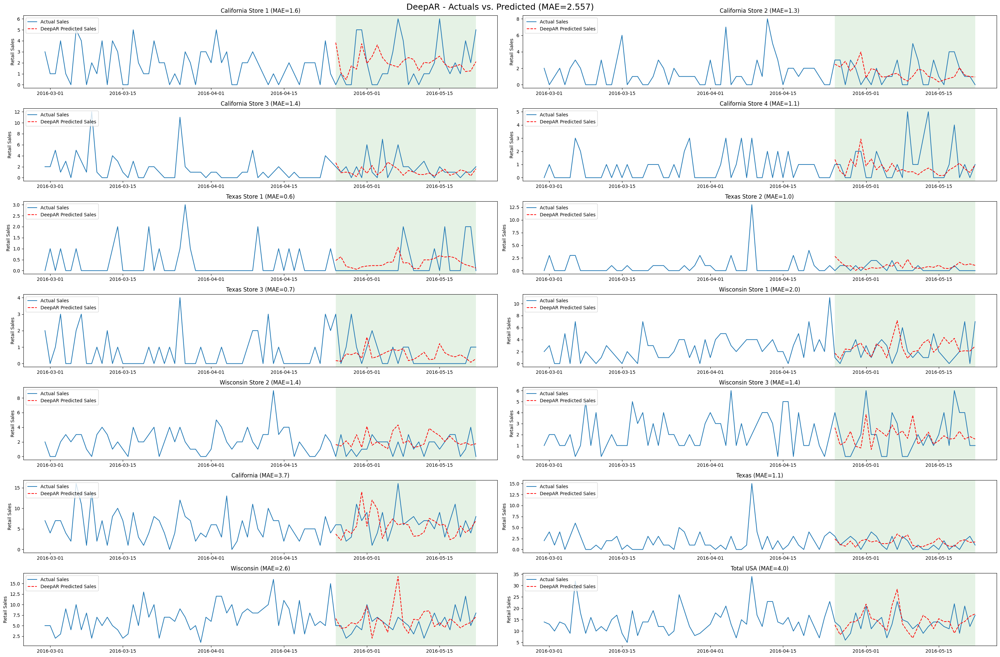

In [114]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h1 style='margin:10px 5px'>Hierarchical Forecasting with Nixtla</h1>
</div>

<div>
<img src="images/hierarchical_motivation2.png" width="800"/>
</div>
<br>
<center>Figure: Hierarchical Forecasting</center>

**Nixtla** is an open-source time series ecosystem that offers probabilistic hierarchical forecasting with statistical and econometric methods.

The HierarchicalForecast library offers a Python collection of reconciliation methods, datasets, evaluation and visualization tools for the task. Among its available reconciliation methods we have BottomUp, TopDown, MiddleOut, MinTrace, ERM. Among its probabilistic coherent methods we have Normality, Bootstrap, PERMBU.

To achieve “**coherency**”, most statistical solutions to the hierarchical forecasting challenge implement a two-stage reconciliation process.
1. First, we obtain a set of the base forecast 
2. Later, we reconcile them into coherent forecasts 


<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Configuration</h3>
</div>

In [116]:
season_length = 7

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Data Preprocessing</h3>
</div>

Note that the steps above give us a dataframe representing a hierarchical structure: 

\begin{equation}
Total = CA + TX + WI \\
CA = CA_1 + CA_2 + CA_3 + CA_4 \\
TX = TX_1 + TX_2 + TX_3 \\
WI = WI_1 + WI_2 + WI_3 \\
\end{equation}

Next step is the summing matrix: recall that $S$ is an $m$x$n$ matrix where $m$ = number of unique series across all levels (stores + states + total) and $n$ = (stores)

In [117]:
xset = set(final_df.group_id.unique())
S = np.zeros((len(xset), len([f for f in xset if '_' in f])))

# rows / columns
list1 = ['Total', 'CA','CA_1','CA_2','CA_3','CA_4','TX','TX_1','TX_2','TX_3','WI','WI_1','WI_2','WI_3']
list2 = ['CA_1','CA_2','CA_3','CA_4','TX_1','TX_2','TX_3','WI_1','WI_2','WI_3']
S = pd.DataFrame(S); S.index = list1; S.columns = list2

# encode the hierarchical structure
S.loc['Total'] = 1
S.loc['CA'][['CA_1','CA_2','CA_3', 'CA_4']] = 1
S.loc['TX'][['TX_1','TX_2','TX_3']] = 1
S.loc['WI'][['WI_1','WI_2','WI_3']] = 1
for x in S.columns:
    S.loc[x][x]= 1
S = S.astype(int)
S

,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
Total,1,1,1,1,1,1,1,1,1,1
CA,1,1,1,1,0,0,0,0,0,0
CA_1,1,0,0,0,0,0,0,0,0,0
CA_2,0,1,0,0,0,0,0,0,0,0
CA_3,0,0,1,0,0,0,0,0,0,0
CA_4,0,0,0,1,0,0,0,0,0,0
TX,0,0,0,0,1,1,1,0,0,0
TX_1,0,0,0,0,1,0,0,0,0,0
TX_2,0,0,0,0,0,1,0,0,0,0
TX_3,0,0,0,0,0,0,1,0,0,0


We have the hierarchical setup ready, so let us build a set of baseline forecasts: we will use the last 7 days as test set.

In [118]:
dfx.rename(columns={"group_id":"unique_id"},inplace=True)

In [119]:
x_test = dfx.rename(columns={"group_id":"unique_id"}).groupby('unique_id').tail(prediction_length)
x_train = dfx.rename(columns={"group_id":"unique_id"}).drop(x_test.index)
x_test = x_test.set_index('unique_id')[["ds","y"]]
x_train = x_train.set_index('unique_id')[["ds","y"]]

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Pooled Method</h3>
</div>

In [120]:
#Define algorithm
algorithm = "BHM-Nixtla-Pooled"

In [121]:
# Compute base auto-ARIMA predictions
fcst = StatsForecast(df = x_train, models=[AutoARIMA(season_length=season_length)], freq='D', n_jobs=-1)
x_hat = fcst.forecast(h = prediction_length)

What do error metrics look like for the raw (unreconciled) forecasts?

In [122]:
xmat = pd.merge(left = x_test, right = x_hat, on = ['ds', 'unique_id'])
xmat.columns = [['ds', 'y', 'pred']]
xmat.head(3)

,ds,y,pred
unique_id,,,
CA_1,2016-04-25,0.0,1.485274
CA_2,2016-04-25,3.0,1.486021
CA_3,2016-04-25,2.0,1.529184


In [123]:
#Get MAE
error_country = np.round(mean_absolute_error(xmat.loc["Total","y"], xmat.loc["Total","pred"]),3)
error_state = np.round(mean_absolute_error(xmat.loc[xmat.index.isin(["CA","TX","WI"]),"y"], xmat.loc[xmat.index.isin(["CA","TX","WI"]),"pred"]),3)
error_store = np.round(mean_absolute_error(xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"y"],
                                          xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"pred"]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == "BHM-Nixtla-Pooled",["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,3.725,1.919,1.169,2.271
4,Non-Hierarchical,DeepAR,3.971,2.464,1.236,2.557
5,Non-Hierarchical,BHM-Nixtla-Pooled,3.898,2.234,1.144,2.425
6,Hierarchical,BHM-Nixtla-BottomUp,0.000,0.000,0.000,0.000
7,Hierarchical,BHM-Nixtla-TopDown,0.000,0.000,0.000,0.000
8,Hierarchical,BHM-Nixtla-MiddleOut,0.000,0.000,0.000,0.000
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


In [124]:
#Get dataframe for actuals vs. predicted
for group_id in group_ids_ls:
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = xmat.loc[group_id,"pred"].values
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

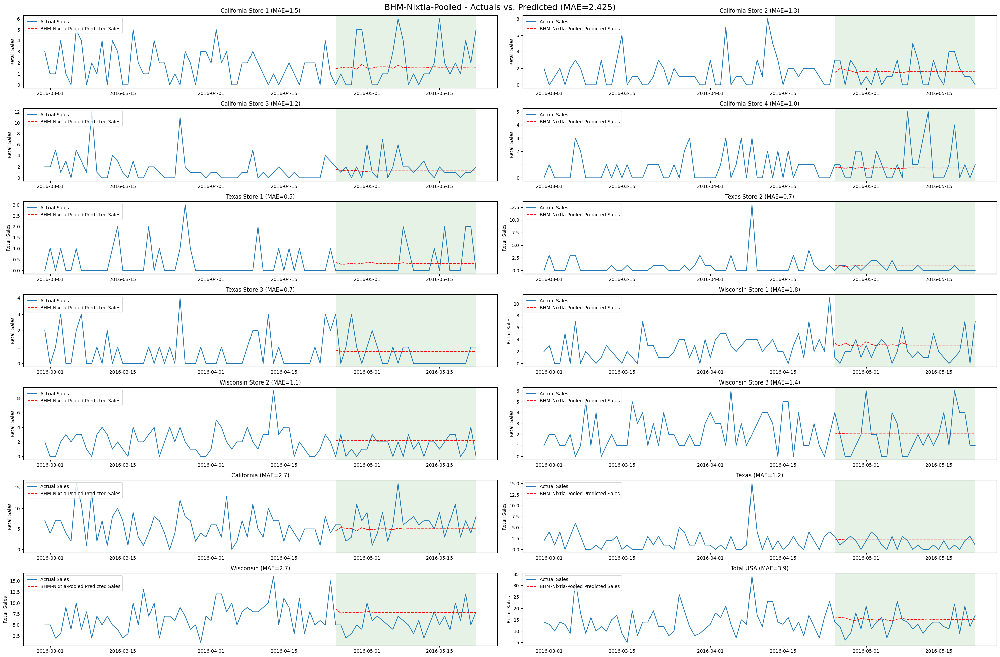

In [125]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>BottomUp Reconciliation</h3>
</div>

* forecast each of the disaggregated series at the lowest level of the hierarchy

* add up to the higher levels

In [126]:
#Define algorithm
algorithm = "BHM-Nixtla-BottomUp"

In [127]:
tags

{'Country': array(['Total'], dtype=object),
 'Country/State': array(['CA', 'TX', 'WI'], dtype=object),
 'Country/State/Store': array(['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1',
        'WI_2', 'WI_3'], dtype=object)}

In [128]:
# Reconcile the base predictions
reconcilers = [
    BottomUp()
]

hrec = HierarchicalReconciliation(reconcilers = reconcilers)
x_hat_rec = hrec.reconcile(x_hat, S, tags)

In [129]:
def mse(y, y_hat):
    return np.mean((y-y_hat)**2)

evaluator = HierarchicalEvaluation(evaluators=[mse])
evaluator.evaluate(Y_hat_df = x_hat_rec, Y_test_df = x_test, 
                   tags=tags, benchmark='AutoARIMA')

,,AutoARIMA,AutoARIMA/BottomUp
level,metric,,
Overall,mse-scaled,1.0,0.937075
Country,mse-scaled,1.0,0.919303
Country/State,mse-scaled,1.0,0.892331
Country/State/Store,mse-scaled,1.0,1.0


In [130]:
xmat = pd.merge(left = x_test, right = x_hat_rec, on = ['ds', 'unique_id'])
xmat.head(3)

,ds,y,AutoARIMA,AutoARIMA/BottomUp
unique_id,,,,
CA_1,2016-04-25,0.0,1.485274,1.485274
CA_2,2016-04-25,3.0,1.486021,1.486021
CA_3,2016-04-25,2.0,1.529184,1.529184


In [131]:
xmat = pd.merge(left = x_test, right = x_hat_rec, on = ['ds', 'unique_id'])
xmat.columns = [['ds', 'y', 'pred_orig', 'pred_reconciled']]

In [132]:
#Get MAE
error_country = np.round(mean_absolute_error(xmat.loc["Total","y"], xmat.loc["Total","pred_reconciled"]),3)
error_state = np.round(mean_absolute_error(xmat.loc[xmat.index.isin(["CA","TX","WI"]),"y"], xmat.loc[xmat.index.isin(["CA","TX","WI"]),"pred_reconciled"]),3)
error_store = np.round(mean_absolute_error(xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"y"],
                                          xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"pred_reconciled"]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == "BHM-Nixtla-BottomUp",["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,3.725,1.919,1.169,2.271
4,Non-Hierarchical,DeepAR,3.971,2.464,1.236,2.557
5,Non-Hierarchical,BHM-Nixtla-Pooled,3.898,2.234,1.144,2.425
6,Hierarchical,BHM-Nixtla-BottomUp,3.580,2.072,1.144,2.265
7,Hierarchical,BHM-Nixtla-TopDown,0.000,0.000,0.000,0.000
8,Hierarchical,BHM-Nixtla-MiddleOut,0.000,0.000,0.000,0.000
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


In [133]:
#Get dataframe for actuals vs. predicted
for group_id in group_ids_ls:
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = xmat.loc[group_id,"pred_reconciled"].values
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

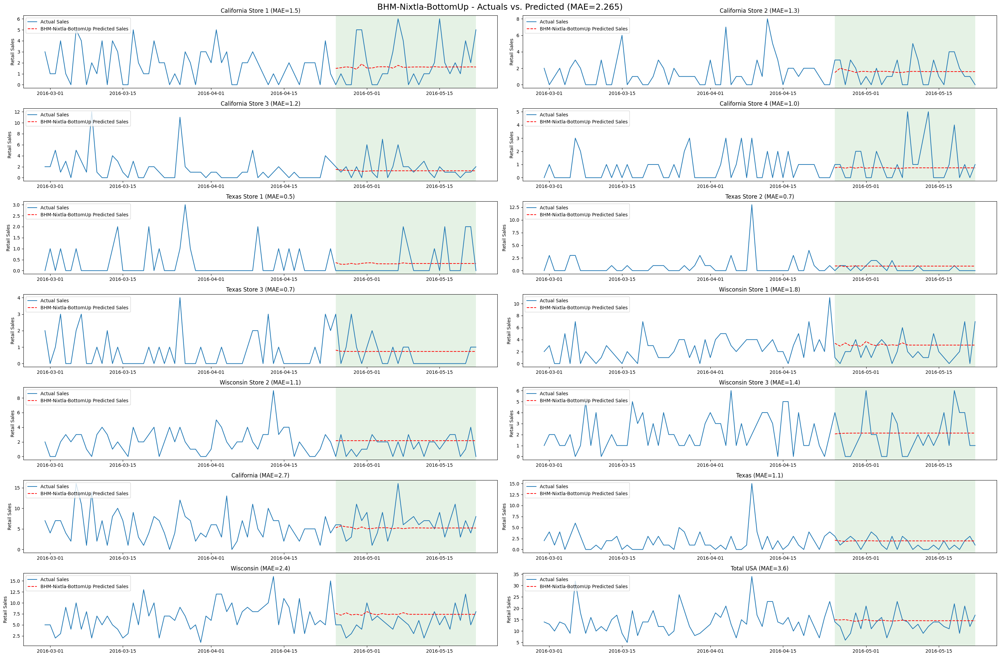

In [134]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

* no information lost due to aggregation

* ignores relationships between series 

* lower levels can be noisy

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>TopDown Reconciliation</h3>
</div>

This approach is the opposite of the previous one: we forecast the highest level series and the disaggregate it based on proportions:
- average historical proportions:
\begin{equation*}
p_j = \frac{1}{T} \sum_{t=1}^T \frac{y_{j,t}}{y_t}
\end{equation*}
- proportions of historical averages: 
\begin{equation*}
p_j = \frac{\sum_{t=1}^T \frac{y_{j,t}}{T}}{\sum_{t=1}^T \frac{y_{t}}{y_t}}
\end{equation*}

In [135]:
#Define algorithm
algorithm = "BHM-Nixtla-TopDown"

In [136]:
# Reconcile the base predictions
reconcilers = [
    TopDown(method='forecast_proportions')
]

hrec = HierarchicalReconciliation(reconcilers = reconcilers)
x_hat_rec = hrec.reconcile(x_hat, S, tags)

In [137]:
evaluator = HierarchicalEvaluation(evaluators=[mse])
evaluator.evaluate(Y_hat_df = x_hat_rec, Y_test_df = x_test, 
                   tags=tags, benchmark='AutoARIMA')

,,AutoARIMA,AutoARIMA/TopDown_method-forecast_proportions
level,metric,,
Overall,mse-scaled,1.0,1.019536
Country,mse-scaled,1.0,1.0
Country/State,mse-scaled,1.0,1.013076
Country/State/Store,mse-scaled,1.0,1.044199


In [138]:
xmat = pd.merge(left = x_test, right = x_hat_rec, on = ['ds', 'unique_id'])
xmat.columns = [['ds', 'y', 'pred_orig', 'pred_reconciled']]

In [139]:
#Get MAE
error_country = np.round(mean_absolute_error(xmat.loc["Total","y"], xmat.loc["Total","pred_reconciled"]),3)
error_state = np.round(mean_absolute_error(xmat.loc[xmat.index.isin(["CA","TX","WI"]),"y"], xmat.loc[xmat.index.isin(["CA","TX","WI"]),"pred_reconciled"]),3)
error_store = np.round(mean_absolute_error(xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"y"],
                                          xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"pred_reconciled"]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == "BHM-Nixtla-TopDown",["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,3.725,1.919,1.169,2.271
4,Non-Hierarchical,DeepAR,3.971,2.464,1.236,2.557
5,Non-Hierarchical,BHM-Nixtla-Pooled,3.898,2.234,1.144,2.425
6,Hierarchical,BHM-Nixtla-BottomUp,3.580,2.072,1.144,2.265
7,Hierarchical,BHM-Nixtla-TopDown,3.898,2.246,1.179,2.441
8,Hierarchical,BHM-Nixtla-MiddleOut,0.000,0.000,0.000,0.000
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


In [140]:
#Get dataframe for actuals vs. predicted
for group_id in group_ids_ls:
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = xmat.loc[group_id,"pred_reconciled"].values
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

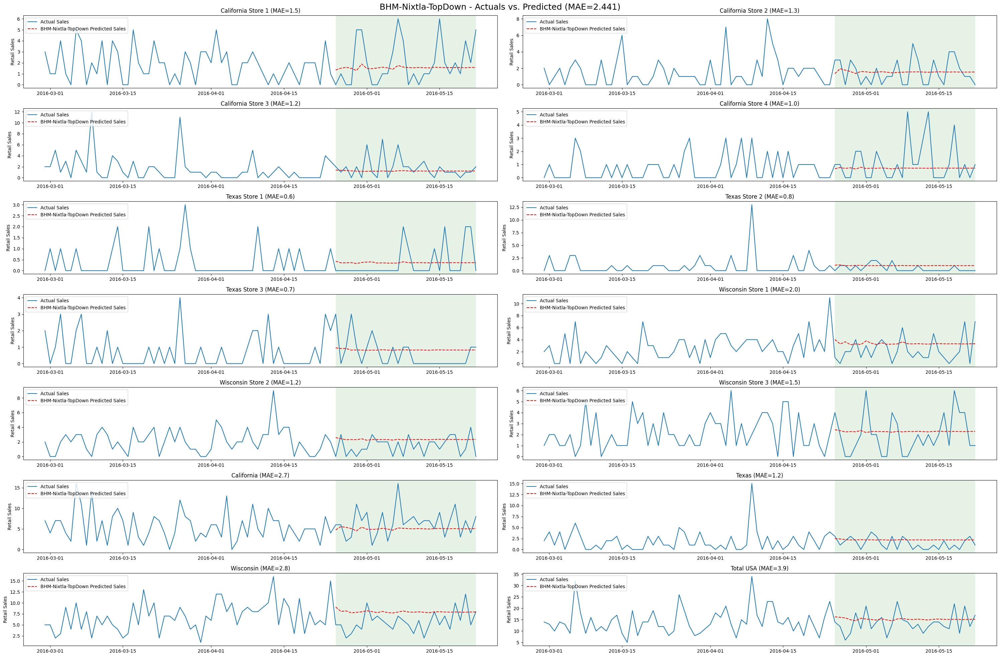

In [141]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>MiddleOut Reconciliation</h3>
</div>

This approach combines the previous two:

* bottom-up and top-down together

* pick a middle level, use bottoms-up to find overall sales

* disintegrate sales using proportion to find the most granual level values

In [142]:
#Define algorithm
algorithm = "BHM-Nixtla-MiddleOut"

In [143]:
# Reconcile the base predictions
reconcilers = [
    MiddleOut(middle_level = 'Country/State', top_down_method='forecast_proportions')
]

hrec = HierarchicalReconciliation(reconcilers = reconcilers)
x_hat_rec = hrec.reconcile(x_hat, S, tags).fillna(0)


In [144]:
evaluator = HierarchicalEvaluation(evaluators=[mse])
evaluator.evaluate(Y_hat_df = x_hat_rec, Y_test_df = x_test, 
                   tags=tags, benchmark='AutoARIMA')


,,AutoARIMA,AutoARIMA/MiddleOut_middle_level-Country/State_top_down_method-forecast_proportions
level,metric,,
Overall,mse-scaled,1.0,1.004443
Country,mse-scaled,1.0,0.971459
Country/State,mse-scaled,1.0,1.0
Country/State/Store,mse-scaled,1.0,1.039349


In [145]:
xmat = pd.merge(left = x_test, right = x_hat_rec, on = ['ds', 'unique_id'])
xmat.columns = [['ds', 'y', 'pred_orig', 'pred_reconciled']]

In [146]:
#Get MAE
error_country = np.round(mean_absolute_error(xmat.loc["Total","y"], xmat.loc["Total","pred_reconciled"]),3)
error_state = np.round(mean_absolute_error(xmat.loc[xmat.index.isin(["CA","TX","WI"]),"y"], xmat.loc[xmat.index.isin(["CA","TX","WI"]),"pred_reconciled"]),3)
error_store = np.round(mean_absolute_error(xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"y"],
                                          xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"pred_reconciled"]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == "BHM-Nixtla-MiddleOut",["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,3.725,1.919,1.169,2.271
4,Non-Hierarchical,DeepAR,3.971,2.464,1.236,2.557
5,Non-Hierarchical,BHM-Nixtla-Pooled,3.898,2.234,1.144,2.425
6,Hierarchical,BHM-Nixtla-BottomUp,3.580,2.072,1.144,2.265
7,Hierarchical,BHM-Nixtla-TopDown,3.898,2.246,1.179,2.441
8,Hierarchical,BHM-Nixtla-MiddleOut,3.820,2.234,1.176,2.410
9,Hierarchical,BHM-Nixtla-MinTrace,0.000,0.000,0.000,0.000


In [147]:
#Get dataframe for actuals vs. predicted
for group_id in group_ids_ls:
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = xmat.loc[group_id,"pred_reconciled"].values
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

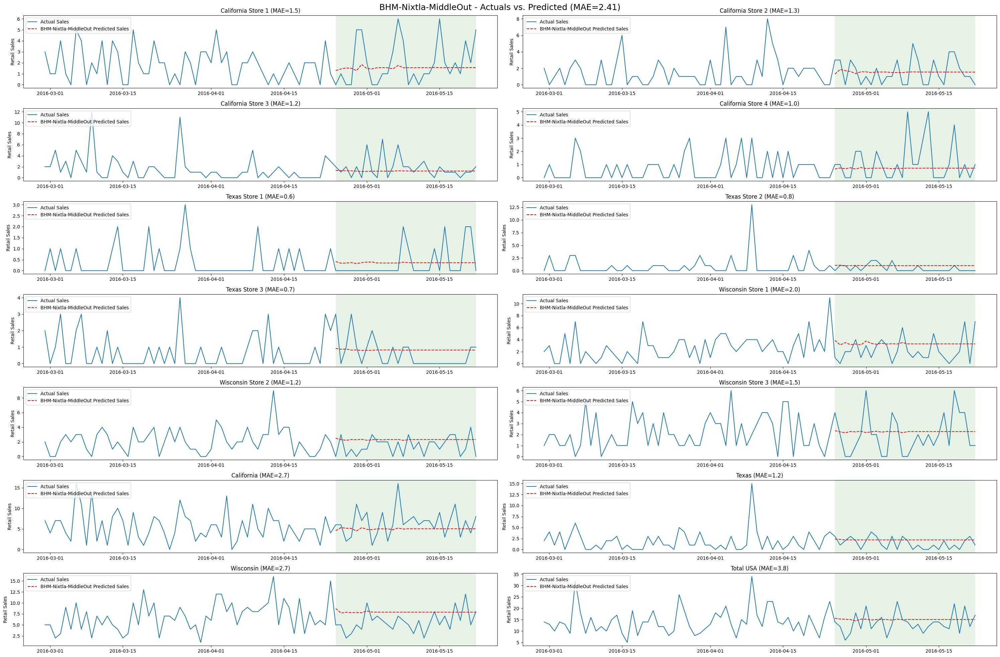

In [148]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>MinTrace Reconciliation</h3>
</div>

* predict for all the layers independently

* construct a mapping matrix minimising the overall variance of the forecasts 

* assumes forecasts are unbiased 

* original paper: https://www.tandfonline.com/doi/abs/10.1080/01621459.2018.1448825?journalCode=uasa20

In [149]:
#Define algorithm
algorithm = "BHM-Nixtla-MinTrace"

In [150]:
# Reconcile the base predictions
reconcilers = [
    MinTrace(method='ols'),
]

hrec = HierarchicalReconciliation(reconcilers = reconcilers)
x_hat_rec = hrec.reconcile(x_hat, S, tags)

In [151]:
print(x_hat.shape, x_train.shape)

(392, 2) (26642, 2)


In [152]:
evaluator = HierarchicalEvaluation(evaluators=[mse])
evaluator.evaluate(Y_hat_df = x_hat_rec, Y_test_df = x_test, 
                   tags=tags, benchmark='AutoARIMA')

,,AutoARIMA,AutoARIMA/MinTrace_method-ols
level,metric,,
Overall,mse-scaled,1.0,0.998126
Country,mse-scaled,1.0,0.984875
Country/State,mse-scaled,1.0,0.979551
Country/State/Store,mse-scaled,1.0,1.029639


In [153]:
xmat = pd.merge(left = x_test, right = x_hat_rec, on = ['ds', 'unique_id'])
xmat.columns = [['ds', 'y', 'pred_orig', 'pred_reconciled']]

In [154]:
#Get MAE
error_country = np.round(mean_absolute_error(xmat.loc["Total","y"], xmat.loc["Total","pred_reconciled"]),3)
error_state = np.round(mean_absolute_error(xmat.loc[xmat.index.isin(["CA","TX","WI"]),"y"], xmat.loc[xmat.index.isin(["CA","TX","WI"]),"pred_reconciled"]),3)
error_store = np.round(mean_absolute_error(xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"y"],
                                          xmat.loc[~xmat.index.isin(["Total","CA","TX","WI"]),"pred_reconciled"]),3)
error_overall = np.round(np.mean([error_country, error_state, error_store]),3)
error_matrix.loc[error_matrix.Algorithm == "BHM-Nixtla-MinTrace",["MAE-Country","MAE-State","MAE-Store","MAE-Overall"]] = [error_country,error_state,error_store,error_overall]
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,3.725,1.919,1.169,2.271
4,Non-Hierarchical,DeepAR,3.971,2.464,1.236,2.557
5,Non-Hierarchical,BHM-Nixtla-Pooled,3.898,2.234,1.144,2.425
6,Hierarchical,BHM-Nixtla-BottomUp,3.580,2.072,1.144,2.265
7,Hierarchical,BHM-Nixtla-TopDown,3.898,2.246,1.179,2.441
8,Hierarchical,BHM-Nixtla-MiddleOut,3.820,2.234,1.176,2.410
9,Hierarchical,BHM-Nixtla-MinTrace,3.853,2.206,1.173,2.411


In [155]:
#Get dataframe for actuals vs. predicted
for group_id in group_ids_ls:
    sub_predictions_df = pd.DataFrame(columns=["algorithm","hierarchy","date","actuals","predicted"])
    sub_predictions_df["date"] = final_df["ds"].unique()
    sub_predictions_df["actuals"] = final_df.loc[final_df.group_id == group_id,"y"].values
    sub_predictions_df["hierarchy"] = group_id
    sub_predictions_df.loc[sub_predictions_df.date.isin([t for t in validation_df["ds"].unique()]),"predicted"] = xmat.loc[group_id,"pred_reconciled"].values
    sub_predictions_df["algorithm"] = algorithm
    predictions_df = pd.concat([predictions_df,sub_predictions_df],axis=0)

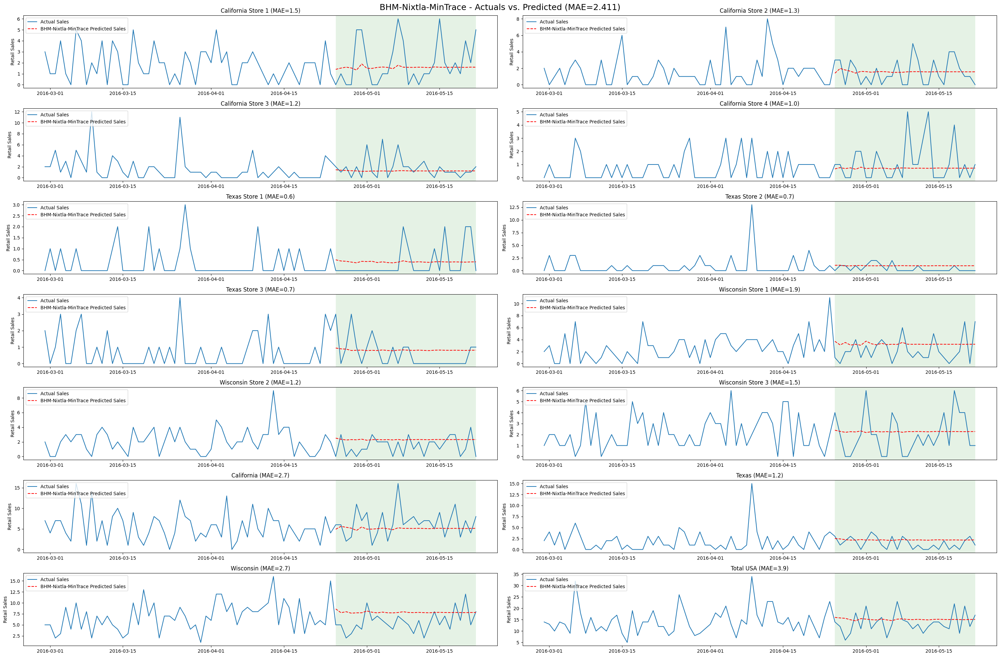

In [156]:
#Get actuals vs. predicted
get_actsvspred(algorithm, predictions_df, error_overall)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"><h1 style='margin:10px 5px'>Overall Results</h1>
</div>

In [157]:
predictions_df.head()

,algorithm,hierarchy,date,actuals,predicted
0,LSTM-Stateless,CA_1,2011-01-29,3.0,NaN
1,LSTM-Stateless,CA_1,2011-01-30,7.0,NaN
2,LSTM-Stateless,CA_1,2011-01-31,4.0,NaN
3,LSTM-Stateless,CA_1,2011-02-01,5.0,NaN
4,LSTM-Stateless,CA_1,2011-02-02,8.0,NaN


In [158]:
predictions_df.to_csv("All-Algorithms-Predictions.csv",index=False)

In [159]:
error_matrix

,Model Type,Algorithm,MAE-Country,MAE-State,MAE-Store,MAE-Overall
0,Non-Hierarchical,LSTM-Stateless,3.513,1.777,1.093,2.128
1,Non-Hierarchical,LSTM-Stateful,3.355,1.877,1.108,2.113
2,Non-Hierarchical,TemporalFusionTransformer,3.996,1.834,1.084,2.305
3,Non-Hierarchical,NeuralProphet,3.725,1.919,1.169,2.271
4,Non-Hierarchical,DeepAR,3.971,2.464,1.236,2.557
5,Non-Hierarchical,BHM-Nixtla-Pooled,3.898,2.234,1.144,2.425
6,Hierarchical,BHM-Nixtla-BottomUp,3.580,2.072,1.144,2.265
7,Hierarchical,BHM-Nixtla-TopDown,3.898,2.246,1.179,2.441
8,Hierarchical,BHM-Nixtla-MiddleOut,3.820,2.234,1.176,2.410
9,Hierarchical,BHM-Nixtla-MinTrace,3.853,2.206,1.173,2.411


In [160]:
error_matrix.to_csv("All-Algorithms-ErrorMatrix.csv",index=False)